In [541]:
import warnings
warnings.filterwarnings("ignore")

In [542]:
# Instalar las librerías necesarias
%pip install requests
%pip install kneed


Note: you may need to restart the kernel to use updated packages.



In [543]:
# Importar librerías
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
import requests
from io import StringIO
%pip install kneed
from kneed import KneeLocator
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA, FactorAnalysis


Note: you may need to restart the kernel to use updated packages.


# Lectura del dataset
Utilizaremos el conjunto de datos de calidad del vino. Este conjunto de datos contiene varias propiedades químicas del vino, como la acidez, el azúcar, el pH y el alcohol. También contiene una métrica de calidad (3-9, siendo mejor la más alta) y un color (rojo o blanco).

In [544]:
# URL del archivo CSV en GitHub
url = 'https://raw.githubusercontent.com/osiris-contreras/Osiris-Contreras-Trillos-/main/Wine_Quality_Data.csv'

# Obtener los datos del archivo CSV
response = requests.get(url)
csv_data = response.content.decode('utf-8')

# Leer los datos del archivo CSV utilizando pandas
df = pd.read_csv(StringIO(csv_data))

# Mostrar las primeras filas del DataFrame
df.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


In [545]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         6497 non-null   float64
 1   volatile_acidity      6497 non-null   float64
 2   citric_acid           6497 non-null   float64
 3   residual_sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free_sulfur_dioxide   6497 non-null   float64
 6   total_sulfur_dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   int64  
 12  color                 6497 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [546]:
df.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [547]:
# Descripción estadística general de las variables categóricas
df.describe(include=['object'])

,color
count,6497
unique,2
top,white
freq,4898


In [703]:
df.shape

(6497, 13)

In [548]:
# Comprobación de valores duplicados
df.duplicated().sum()

1177

In [549]:
# Eliminación de valores duplicados
df2 = df.drop_duplicates()

# Comprobación de valores duplicados
df2.duplicated().sum()
df2.shape

(5320, 13)

In [550]:
df2.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5,red


# Análisis exploratorio de los datos

In [551]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5320 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         5320 non-null   float64
 1   volatile_acidity      5320 non-null   float64
 2   citric_acid           5320 non-null   float64
 3   residual_sugar        5320 non-null   float64
 4   chlorides             5320 non-null   float64
 5   free_sulfur_dioxide   5320 non-null   float64
 6   total_sulfur_dioxide  5320 non-null   float64
 7   density               5320 non-null   float64
 8   pH                    5320 non-null   float64
 9   sulphates             5320 non-null   float64
 10  alcohol               5320 non-null   float64
 11  quality               5320 non-null   int64  
 12  color                 5320 non-null   object 
dtypes: float64(11), int64(1), object(1)
memory usage: 581.9+ KB


In [552]:
# Descripción estadística general de las variables categóricas
df2.describe(include=['object'])

,color
count,5320
unique,2
top,white
freq,3961


In [553]:
float_columns = [x for x in df2.columns if x not in ['color']]

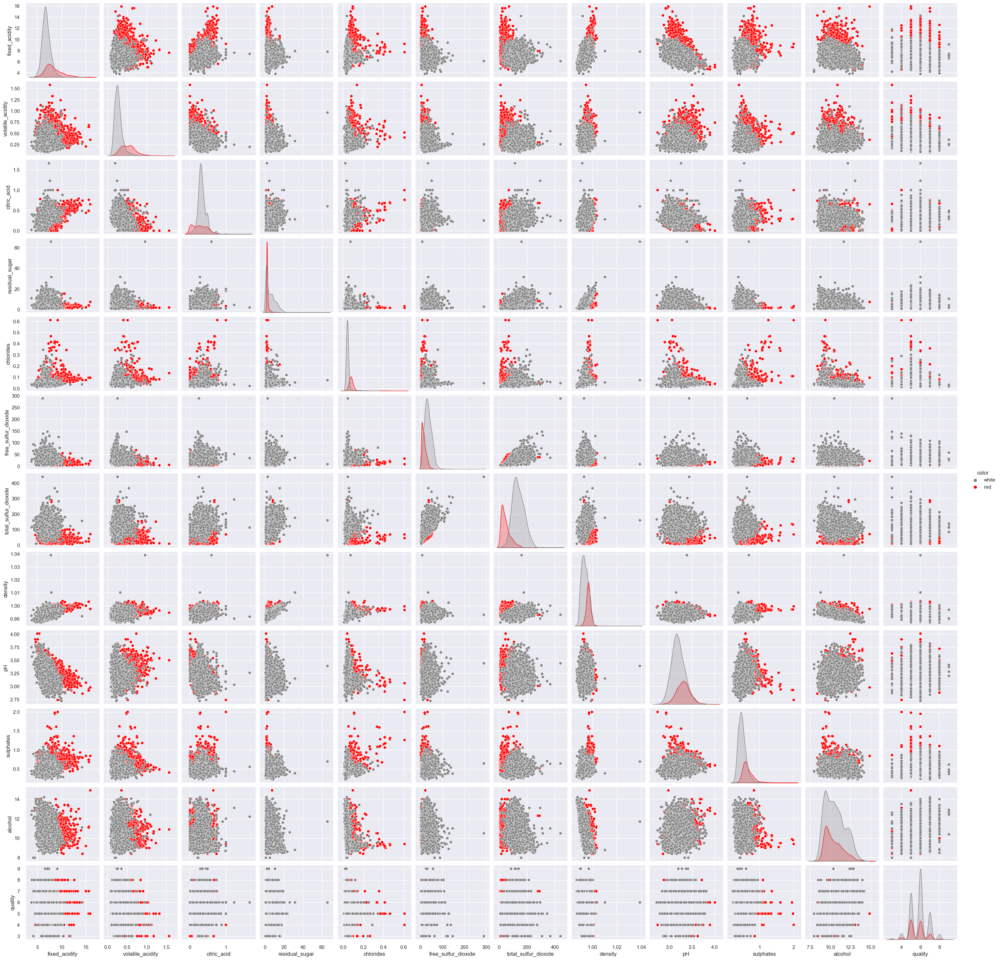

In [554]:
# relaciones entre las variables, con distinción de color
temp = df2[float_columns + ['color']]

sns.set_context('notebook')
sns.pairplot(temp, 
             hue='color', 
             hue_order=['white', 'red'],
             palette={'red':'red', 'white':'gray'});

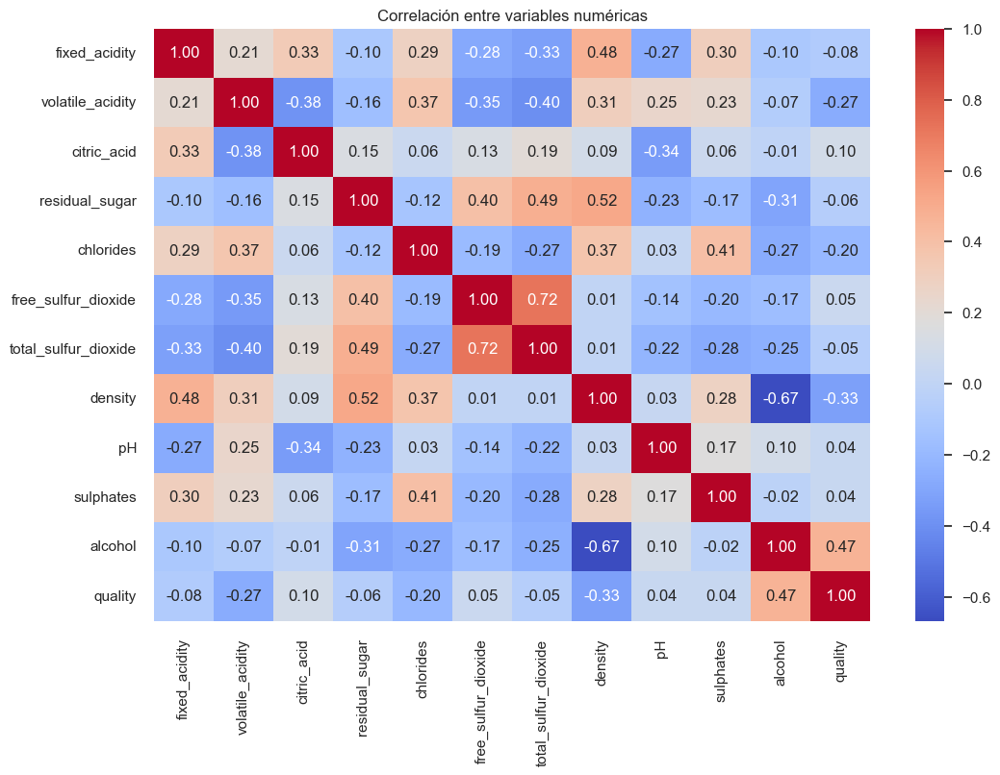

In [555]:
df_numeric = df2.drop(columns=['color'])

# Calcular la matriz de correlación
correlation_matrix = df_numeric.corr()

# Generar el gráfico de correlación utilizando seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlación entre variables numéricas')
plt.show()

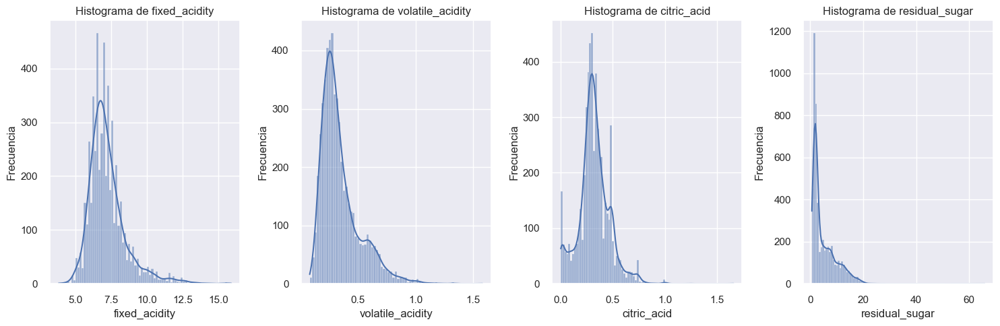

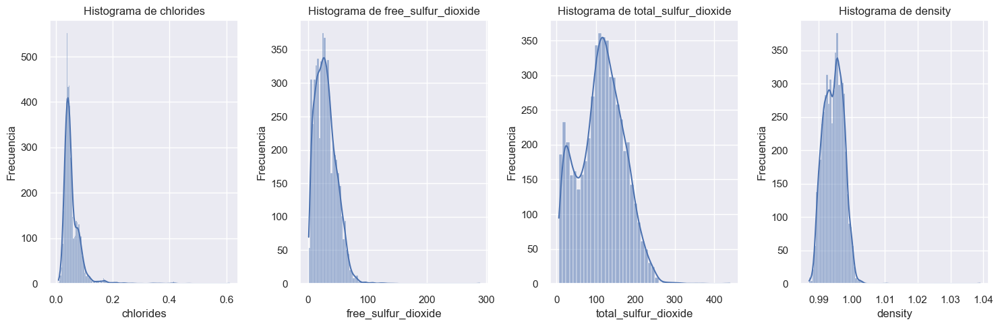

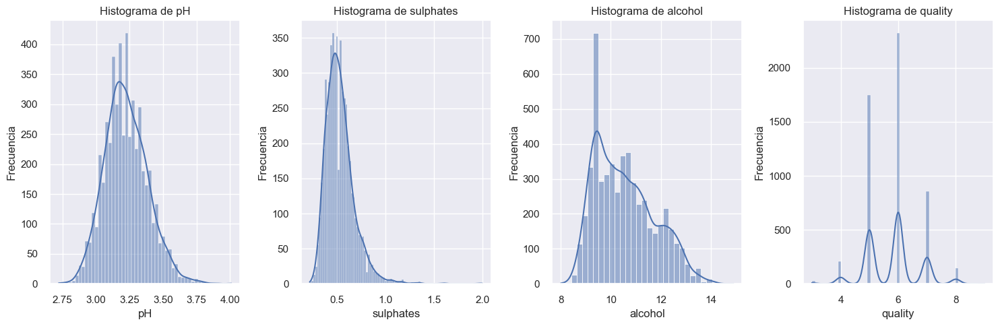

In [556]:
# Configurar el número de columnas en la disposición de subplots
num_columnas = 4

# Histogramas para variables numéricas
for i, num_var in enumerate(float_columns):
    if i % num_columnas == 0:
        plt.figure(figsize=(15, 5))
    plt.subplot(1, num_columnas, i % num_columnas + 1)
    sns.histplot(df2[num_var], kde=True)
    plt.title(f'Histograma de {num_var}')
    plt.xlabel(num_var)
    plt.ylabel('Frecuencia')
    if (i + 1) % num_columnas == 0 or i == len(float_columns) - 1:
        plt.tight_layout()
        plt.show()

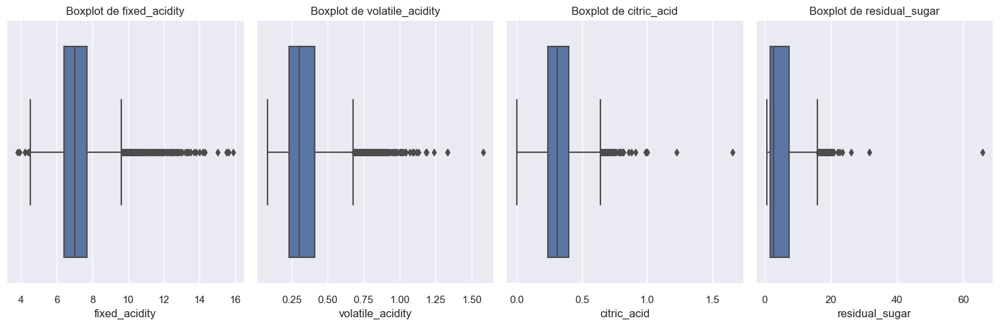

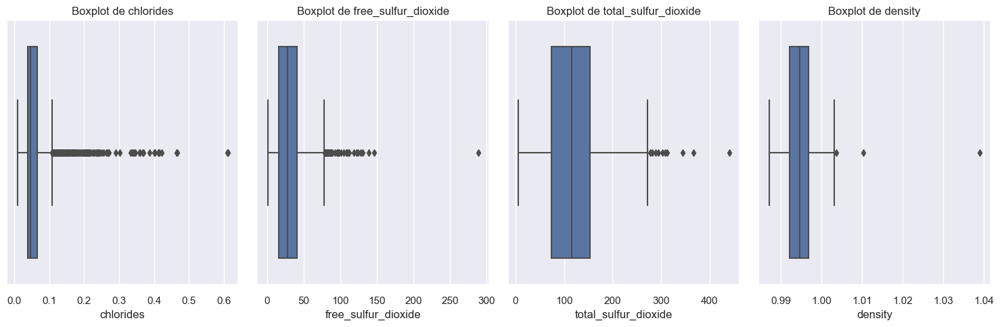

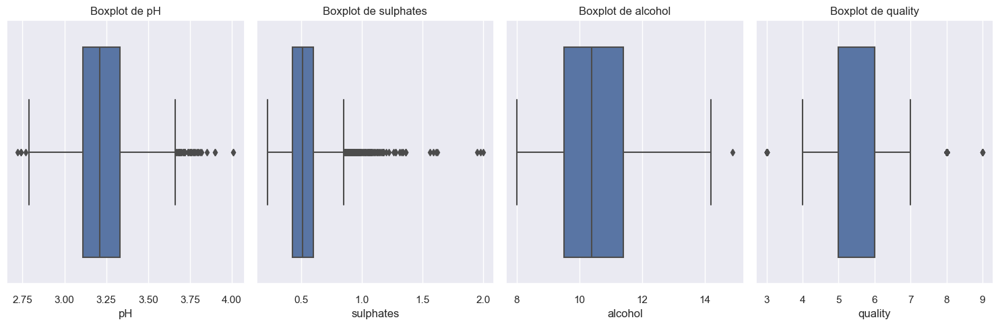

In [557]:
# Boxplots para variables numéricas
for i, num_var in enumerate(float_columns):
    if i % num_columnas == 0:
        plt.figure(figsize=(15, 5))
    plt.subplot(1, num_columnas, i % num_columnas + 1)
    sns.boxplot(x=df2[num_var])
    plt.title(f'Boxplot de {num_var}')
    plt.xlabel(num_var)
    if (i + 1) % num_columnas == 0 or i == len(float_columns) - 1:
        plt.tight_layout()
        plt.show()

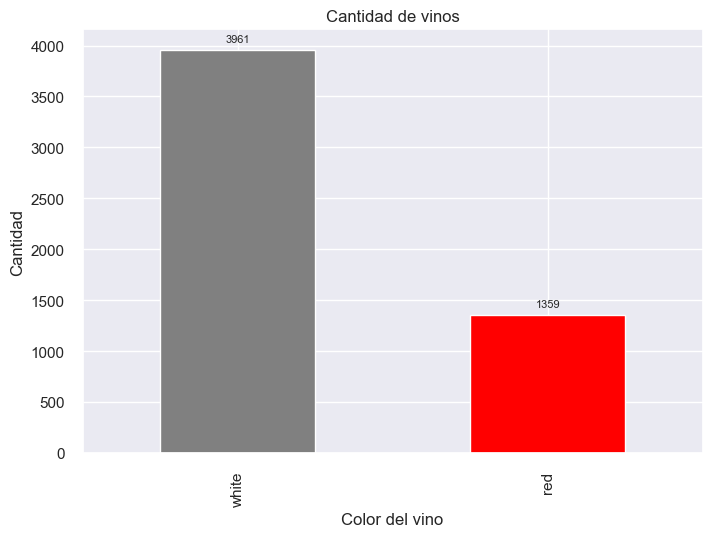

In [558]:
# análisis de color
color_counts = df2['color'].value_counts()
ax = color_counts.plot(kind='bar', color=['gray', 'red'])
for i, v in enumerate(color_counts):
    ax.text(i, v + 50, str(v), ha='center', va='bottom', fontsize=8)
plt.xlabel('Color del vino')
plt.ylabel('Cantidad')
plt.title('Cantidad de vinos')
plt.show()

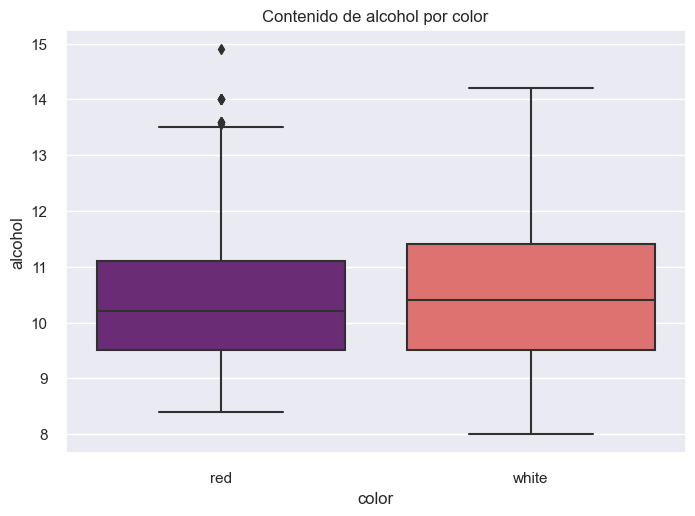

In [559]:
# contenido de alcohol por color
sns.boxplot(x='color', y='alcohol', data=df2, palette = 'magma')
plt.title('Contenido de alcohol por color')
plt.show()

# Preprocesamiento de los datos

## Tratamiento de valores atípicos quantiles

In [560]:
# Crear una copia del DataFrame original
df3 = df2.copy()

# Identificar y manejar outliers en cada columna numérica
for column in df3.columns:
    if df3[column].dtype != 'object': 
        q1 = df3[column].quantile(0.25)
        q3 = df3[column].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        # Reemplazar los valores atípicos por los límites del rango intercuartílico
        df3[column] = df3[column].apply(lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))

In [561]:
df3.shape

(5320, 13)

In [562]:
# Descripción estadística general de las variables categóricas
df3.describe(include=['object'])

,color
count,5320
unique,2
top,white
freq,3961


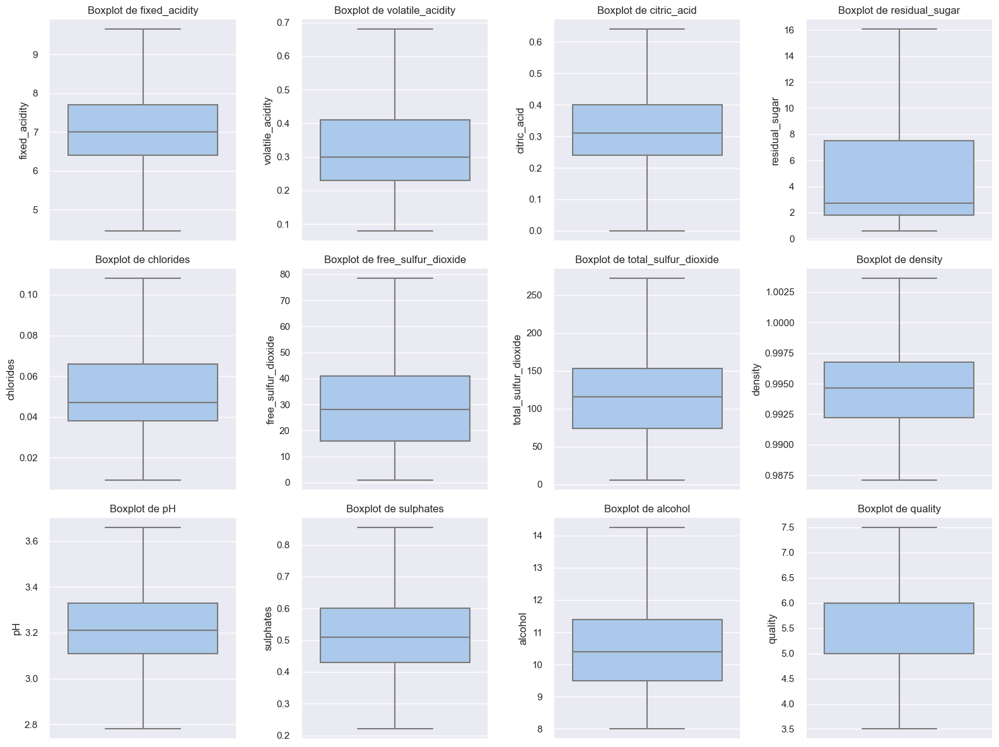

In [563]:
# Boxplots horizontales separados para cada variable en el DataFrame winsorizado
num_variables = df3.drop(columns=['color']).shape[1]
num_cols = min(num_variables, 4)  # Máximo 4 columnas
num_rows = (num_variables + num_cols - 1) // num_cols  # Calcular número de filas

plt.figure(figsize=(num_cols * 4, num_rows * 4))
for i, column in enumerate(df3.drop(columns=['color']).columns):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(y=df3[column], palette='pastel')
    plt.title(f'Boxplot de {column}')
    plt.tight_layout()

plt.show()

## Tratamiento de atípicos Winsorized

In [564]:
# Crear una copia del DataFrame original
df_winsorized = df2.copy()

# Seleccionar las columnas numéricas
numeric_columns = df_winsorized.select_dtypes(include=np.number).columns

# Aplicar la winsorización a cada columna numérica
for column in numeric_columns:
    # Calcular los percentiles 5 y 95
    p5 = np.percentile(df_winsorized[column], 5)
    p95 = np.percentile(df_winsorized[column], 95)
    # Reemplazar los valores atípicos con los valores correspondientes a los percentiles 5 y 95
    df_winsorized[column] = np.where(df_winsorized[column] < p5, p5, df_winsorized[column])
    df_winsorized[column] = np.where(df_winsorized[column] > p95, p95, df_winsorized[column])

# Mostrar las primeras filas del DataFrame winsorizado
df_winsorized.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.68,0.04,1.9,0.076,11.0,34.0,0.9978,3.50,0.56,9.4,5.0,red
1,7.8,0.68,0.04,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0,red
2,7.8,0.68,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5.0,red
3,9.8,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6.0,red
5,7.4,0.66,0.04,1.8,0.075,13.0,40.0,0.9978,3.50,0.56,9.4,5.0,red


In [565]:
df_winsorized.shape

(5320, 13)

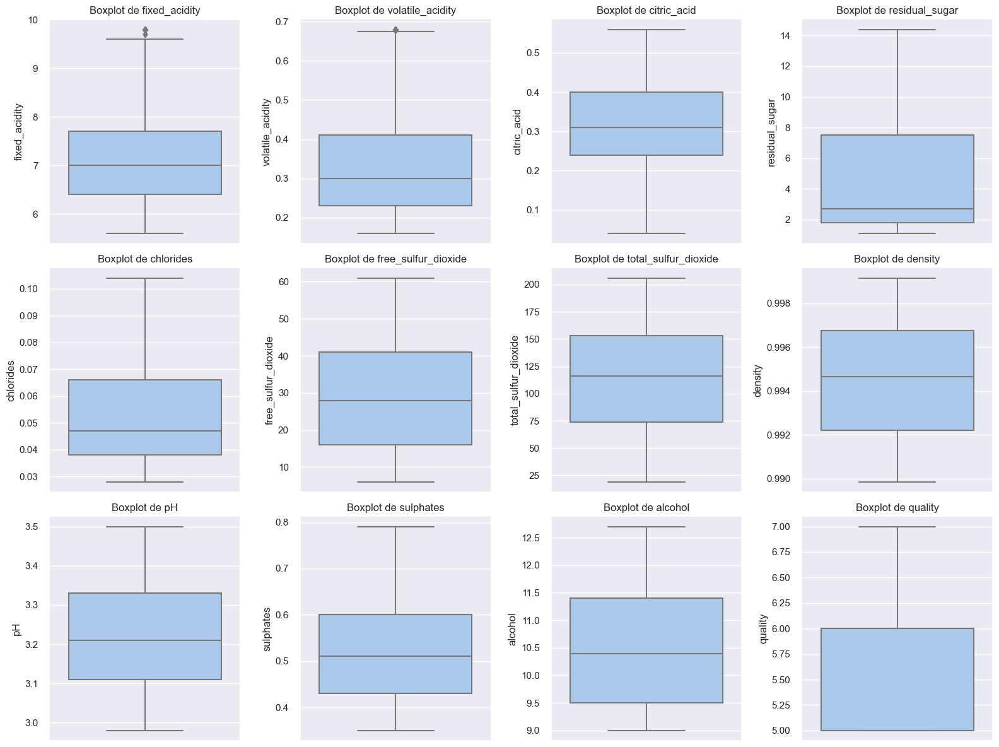

In [566]:
# Boxplots horizontales separados para cada variable en el DataFrame winsorizado
num_variables = df_winsorized.drop(columns=['color']).shape[1]
num_cols = min(num_variables, 4)  # Máximo 4 columnas
num_rows = (num_variables + num_cols - 1) // num_cols  # Calcular número de filas

plt.figure(figsize=(num_cols * 4, num_rows * 4))
for i, column in enumerate(df_winsorized.drop(columns=['color']).columns):
    plt.subplot(num_rows, num_cols, i+1)
    sns.boxplot(y=df_winsorized[column], palette='pastel')
    plt.title(f'Boxplot de {column}')
    plt.tight_layout()

plt.show()

## Reemplazo de las observaciones red and white por las proporciones 

In [567]:
# Calcular la proporción de cada categoría en la columna 'color'
# para el dataframe con tratamiento de atípicos de quantiles 
color_proportions = df3['color'].value_counts(normalize=True)

# Renombrar la variable 'color' por la proporción respectiva en el conjunto de datos
df3['color'] = df3['color'].map(color_proportions)
display(df3.head(2))
display(df3.tail(2))

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.68,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5.0,0.255451
1,7.8,0.68,0.0,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5.0,0.255451


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7.0,0.744549
6496,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6.0,0.744549


In [568]:
# Calcular la proporción de cada categoría en la columna 'color'
# para el dataframe con tratamiento de atípicos de winzorized
color_proportions = df_winsorized['color'].value_counts(normalize=True)

# Renombrar la variable 'color' por la proporción respectiva en el conjunto de datos
df_winsorized['color'] = df_winsorized['color'].map(color_proportions)

# Mostrar las primeras filas del DataFrame con la variable 'color' renombrada
display(df_winsorized.head(2))
display(df_winsorized.tail(2))

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.4,0.68,0.04,1.9,0.076,11.0,34.0,0.9978,3.5,0.56,9.4,5.0,0.255451
1,7.8,0.68,0.04,2.6,0.098,25.0,67.0,0.9968,3.2,0.68,9.8,5.0,0.255451


,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
6495,5.6,0.29,0.30,1.1,0.028,20.0,110.0,0.98985,3.34,0.38,12.7,7.0,0.744549
6496,6.0,0.21,0.38,1.1,0.028,22.0,98.0,0.98985,3.26,0.35,11.8,6.0,0.744549


## Escalado

In [569]:
# Scaling data para el dataset con tratamiento de quiantiles
scaler = StandardScaler()
scaler.fit(df3)
scaled1q = pd.DataFrame(scaler.transform(df3),columns = df3.columns)

# Scaled data
scaled1q.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233
3,2.302554,-0.386644,1.757397,-0.724004,0.973630,-0.759895,-0.957209,1.197786,-0.405096,0.393614,-0.631951,0.259515,-1.707233
4,0.238055,2.164647,-2.273272,-0.747483,0.973630,-0.996285,-1.311627,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233


In [570]:
scaled1q.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
count,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5320.000000,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03
mean,-8.547883e-17,8.547883e-17,-8.547883e-17,-2.136971e-16,3.419153e-16,0.000000,2.136971e-17,2.842171e-15,1.132594e-15,-2.778062e-16,-1.431770e-15,-4.434214e-16,-2.136971e-16
std,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00
min,-2.468731e+00,-1.729429e+00,-2.273272e+00,-1.029232e+00,-2.031186e+00,-1.705453,-1.914137e+00,-2.558431e+00,-2.812689e+00,-2.353804e+00,-2.150417e+00,-2.732720e+00,-1.707233e+00
25%,-6.794994e-01,-7.223400e-01,-5.458422e-01,-7.474828e-01,-7.108880e-01,-0.818992,-7.091163e-01,-8.027702e-01,-7.218847e-01,-7.511432e-01,-8.850289e-01,-9.373794e-01,-1.707233e+00
50%,-1.289665e-01,-2.523653e-01,-4.200868e-02,-5.361709e-01,-3.011405e-01,-0.109824,3.516115e-02,4.229235e-02,-8.830777e-02,-1.406058e-01,-1.257957e-01,2.595145e-01,5.857433e-01
75%,5.133219e-01,4.861664e-01,6.057773e-01,5.908260e-01,5.638821e-01,0.658441,6.952644e-01,7.735301e-01,6.719846e-01,5.462488e-01,7.177967e-01,2.595145e-01,5.857433e-01
max,2.302554e+00,2.298926e+00,2.333207e+00,2.598289e+00,2.476037e+00,2.874591,2.801836e+00,3.137981e+00,2.762789e+00,2.492337e+00,3.122035e+00,2.054855e+00,5.857433e-01


In [571]:
# Scaling data para el dataset winsorizado
scaler = StandardScaler()
scaler.fit(df_winsorized)
scaled2w = pd.DataFrame(scaler.transform(df_winsorized),columns = df_winsorized.columns)

# Scaled data
scaled2w.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,0.217595,2.313302,-2.115235,-0.737525,1.053881,-1.161863,-1.468618,1.197672,1.921114,0.265640,-1.009853,-1.121380,-1.707233
1,0.587157,2.313302,-2.115235,-0.566956,2.090892,-0.285287,-0.857554,0.833633,-0.159077,1.245858,-0.654805,-1.121380,-1.707233
2,0.587157,2.313302,-2.115235,-0.640057,1.808071,-0.911413,-1.098276,0.906441,0.256961,1.000804,-0.654805,-1.121380,-1.707233
3,2.434967,-0.397313,1.894733,-0.737525,1.006744,-0.786188,-0.987174,1.270479,-0.436436,0.429010,-0.654805,0.252898,-1.707233
4,0.217595,2.177771,-2.115235,-0.761892,1.006744,-1.036638,-1.357516,1.197672,1.921114,0.265640,-1.009853,-1.121380,-1.707233


In [572]:
scaled2w.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
count,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03,5.320000e+03
mean,-3.846547e-16,2.564365e-16,-6.410912e-17,-6.410912e-17,8.547883e-17,-2.136971e-17,-4.273941e-17,4.224791e-14,1.709577e-15,2.350668e-16,1.282182e-15,-3.205456e-17,-2.136971e-16
std,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00,1.000094e+00
min,-1.445433e+00,-1.210497e+00,-2.115235e+00,-9.324612e-01,-1.208688e+00,-1.474926e+00,-1.746375e+00,-1.696614e+00,-1.684551e+00,-1.449742e+00,-1.364900e+00,-1.121380e+00,-1.707233e+00
25%,-7.063096e-01,-7.361394e-01,-5.729395e-01,-7.618922e-01,-7.373198e-01,-8.488005e-01,-7.279344e-01,-8.409420e-01,-7.831345e-01,-7.962631e-01,-9.210910e-01,-1.121380e+00,-1.707233e+00
50%,-1.519667e-01,-2.617819e-01,-3.313616e-02,-5.425893e-01,-3.130880e-01,-9.744965e-02,4.978385e-02,5.095145e-02,-8.973756e-02,-1.427842e-01,-1.222344e-01,2.528981e-01,5.857433e-01
75%,4.947667e-01,4.836370e-01,6.608968e-01,6.270264e-01,5.825124e-01,7.165138e-01,7.395459e-01,8.227123e-01,7.423388e-01,5.923795e-01,7.653841e-01,2.528981e-01,5.857433e-01
max,2.434967e+00,2.313302e+00,1.894733e+00,2.308349e+00,2.373713e+00,1.968765e+00,1.716323e+00,1.693127e+00,1.921114e+00,2.148476e+00,1.919288e+00,1.627176e+00,5.857433e-01


# Reducción de la dimensionalidad

In [573]:
#para el dataset con tratamiento de quantiles
#Cree un dataset reducido que proporcione el 85% de la varianza de entrada que debe explicarse
pcaq = PCA(n_components=0.85).fit(scaled1q)

#Veamos cuántas componentes ha conservado PCA:
pcaq.n_components_

7

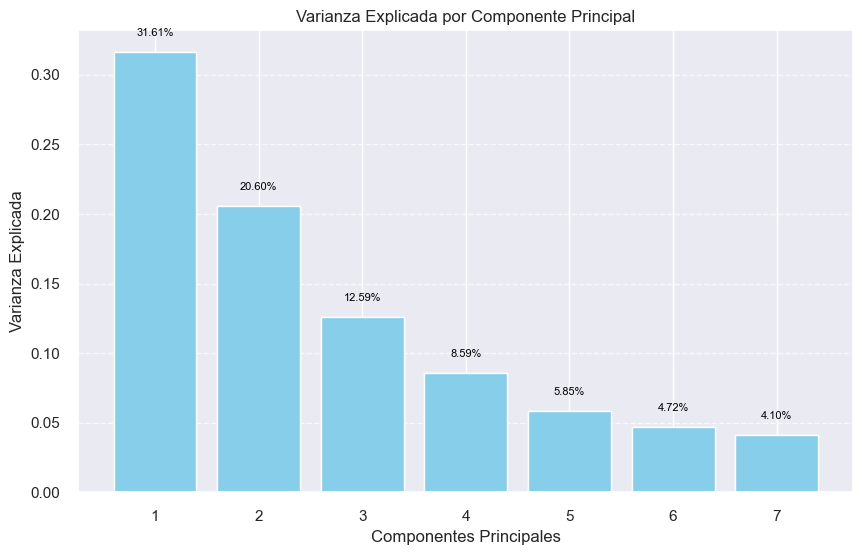

In [574]:
# Obtén la varianza explicada por cada componente
variance_explained = pcaq.explained_variance_ratio_

# Calcula el número de componentes
n_components = pcaq.n_components_

# Crea un array con los índices de los componentes (para el eje x del gráfico)
component_indices = np.arange(1, n_components + 1)

# Crea el gráfico de barras para la varianza explicada por cada componente
plt.figure(figsize=(10, 6))
bars = plt.bar(component_indices, variance_explained, color='skyblue')
plt.bar(component_indices, variance_explained, color='skyblue')
plt.xlabel('Componentes Principales')
plt.ylabel('Varianza Explicada')
plt.title('Varianza Explicada por Componente Principal')

# Agregar etiquetas con el porcentaje de varianza sobre cada barra
for bar, var_explained in zip(bars, variance_explained):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{var_explained*100:.2f}%', ha='center', va='bottom',fontsize=8, color='black')

plt.xticks(component_indices)  # Mostrar todos los componentes en el eje x
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Añadir líneas de cuadrícula en el eje y
plt.show()

In [575]:
#Por último, transforme "scaled1q" de 13 columnas X_pca
X_pca = pcaq.fit_transform(scaled1q)
X_pca

array([[ 4.1019344 , -0.12930929, -2.60852212, ...,  0.40889745,
        -0.24080909, -0.18240693],
       [ 3.91778991,  0.59967298, -1.55597747, ...,  0.58404525,
         1.69395007,  0.2665063 ],
       [ 4.07617966,  0.32336977, -1.48349279, ...,  0.5297617 ,
         0.99353145,  0.25110629],
       ...,
       [-1.08115051, -0.40337348, -0.15597283, ..., -0.17684677,
         0.48224902, -0.1397717 ],
       [-1.87722336, -3.59119184, -0.28820191, ...,  0.32882797,
        -0.39664545, -0.38356983],
       [-1.94836188, -2.52290308,  0.08245025, ..., -0.41278947,
        -0.75999132, -0.44264173]])

In [576]:
# --- Pesos de las variables que componen las componentes principales ---
pesos_pcaq = pd.DataFrame(pcaq.components_, columns = scaled1q.columns,
             index = ['PC 1', 'PC 2', 'PC 3','PC 4', 'PC 5', 'PC 6','PC 7']).round(2).T

pesos_pcaq

,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7
fixed_acidity,0.26,0.19,0.49,0.13,0.12,0.10,-0.06
volatile_acidity,0.36,0.01,-0.25,0.10,0.34,0.38,0.09
citric_acid,-0.11,0.17,0.59,-0.09,-0.33,-0.20,-0.12
residual_sugar,-0.19,0.41,-0.07,-0.19,0.55,-0.30,0.24
chlorides,0.38,0.19,-0.00,-0.04,-0.13,0.20,-0.42
free_sulfur_dioxide,-0.31,0.24,-0.12,-0.30,-0.07,0.54,-0.26
total_sulfur_dioxide,-0.36,0.28,-0.12,-0.13,-0.13,0.30,0.05
density,0.23,0.50,-0.02,-0.19,0.17,-0.24,-0.01
pH,0.15,-0.19,-0.43,-0.45,-0.27,-0.40,-0.19
sulphates,0.27,0.01,0.16,-0.53,-0.28,0.21,0.65


In [577]:
#para el dataset winsorizado
#Cree un dataset reducido que proporcione el 85% de la varianza de entrada que debe explicarse
pcaw = PCA(n_components=0.85).fit(scaled2w)

#Veamos cuántas componentes ha conservado PCA:
pcaw.n_components_

7

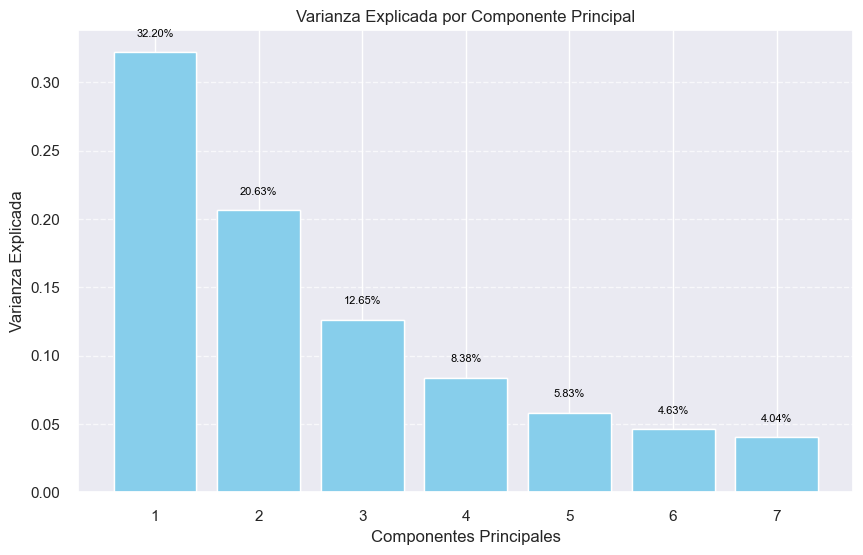

In [578]:
# Obtén la varianza explicada por cada componente
variance_explained = pcaw.explained_variance_ratio_

# Calcula el número de componentes
n_components = pcaw.n_components_

# Crea un array con los índices de los componentes (para el eje x del gráfico)
component_indices = np.arange(1, n_components + 1)

# Crea el gráfico de barras para la varianza explicada por cada componente
plt.figure(figsize=(10, 6))
bars = plt.bar(component_indices, variance_explained, color='skyblue')
plt.bar(component_indices, variance_explained, color='skyblue')
plt.xlabel('Componentes Principales')
plt.ylabel('Varianza Explicada')
plt.title('Varianza Explicada por Componente Principal')

# Agregar etiquetas con el porcentaje de varianza sobre cada barra
for bar, var_explained in zip(bars, variance_explained):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{var_explained*100:.2f}%', ha='center', va='bottom',fontsize=8, color='black')

plt.xticks(component_indices)  # Mostrar todos los componentes en el eje x
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Añadir líneas de cuadrícula en el eje y

In [579]:
#Por último, transforme "scaled2w" de 13 columnas W_pca
W_pca = pcaw.fit_transform(scaled2w)
W_pca

array([[ 4.20647401,  0.07194021, -2.61000714, ...,  0.2255558 ,
        -0.38246508, -0.11797195],
       [ 3.9921338 ,  0.79149638, -1.47945192, ...,  0.4285853 ,
         1.72861021,  0.29898673],
       [ 4.2001027 ,  0.45479552, -1.60385208, ...,  0.46093997,
         1.04047716,  0.36202073],
       ...,
       [-1.12874901, -0.36967989, -0.21795825, ..., -0.17321531,
         0.56005469,  0.25939498],
       [-1.72022908, -3.46233151, -0.40168528, ...,  0.39062195,
        -0.53718962, -0.60902106],
       [-1.79307951, -2.4271741 ,  0.00613082, ..., -0.49053733,
        -0.78797404, -0.44077346]])

In [580]:
# --- Pesos de las variables que componen las componentes principales ---
pesos_pcaw = pd.DataFrame(pcaw.components_, columns = scaled2w.columns,
             index = ['PC 1', 'PC 2', 'PC 3','PC 4', 'PC 5', 'PC 6','PC 7']).round(2).T

pesos_pcaw

,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7
fixed_acidity,0.26,0.16,0.50,-0.12,0.12,0.08,-0.12
volatile_acidity,0.36,0.02,-0.25,-0.10,0.34,0.37,-0.01
citric_acid,-0.12,0.14,0.60,0.09,-0.32,-0.22,-0.17
residual_sugar,-0.19,0.40,-0.05,0.21,0.55,-0.27,0.23
chlorides,0.38,0.19,0.01,0.03,-0.12,0.18,-0.40
free_sulfur_dioxide,-0.31,0.24,-0.10,0.30,-0.06,0.51,-0.35
total_sulfur_dioxide,-0.37,0.27,-0.10,0.13,-0.13,0.30,-0.02
density,0.23,0.50,0.00,0.20,0.17,-0.24,0.00
pH,0.16,-0.18,-0.42,0.46,-0.27,-0.43,-0.24
sulphates,0.27,-0.00,0.16,0.54,-0.27,0.29,0.65


# Clustering Algorithm: K-Means

### Dataset  original  quantiles

In [581]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(scaled1q)
    inertia_list.append(kmeans.inertia_)

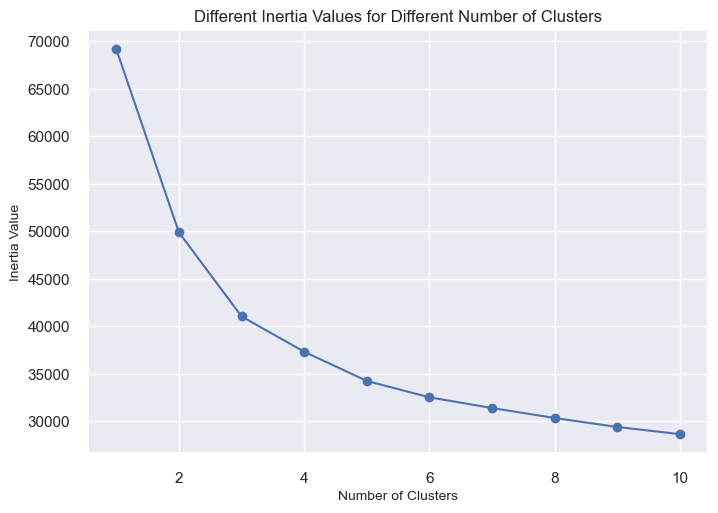

In [582]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [583]:
# Seleccion automatica del numero k
kl = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
kl.elbow

3

In [584]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans = KMeans(n_clusters = 3, **kmeans_constants)
model_kmeans.fit(scaled1q)

KMeans(max_iter=500, n_clusters=3, n_init=100, random_state=42)

In [585]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans.inertia_)
print('Silhouette Score: ', silhouette_score(scaled1q, model_kmeans.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(scaled1q, model_kmeans.labels_))

 ### K-MEANS ###
Inertia:  41050.011536102305


Silhouette Score:  0.24075039586649977
Calinski harabasz score:  1820.47218830983


In [586]:
# Predicción de los clusters
Cluster_1 = model_kmeans.fit_predict(scaled1q)
Cluster_1

array([1, 1, 1, ..., 0, 0, 0])

In [587]:
# crear un dataset para adjuntar los resultados de todos los cluster realizados.
# Vamos a adjuntar 'Cluster_1' como una nueva variable a 'scaled1q':
df_final = scaled1q.copy()
df_final['Cluster_1']= Cluster_1

# A partir de ahora, sólo trabajaremos con "df_final"
df_final.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,Cluster_1
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233,1
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233,1
3,2.302554,-0.386644,1.757397,-0.724004,0.973630,-0.759895,-0.957209,1.197786,-0.405096,0.393614,-0.631951,0.259515,-1.707233,1
4,0.238055,2.164647,-2.273272,-0.747483,0.973630,-0.996285,-1.311627,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1


In [588]:
df_final.Cluster_1.value_counts()

Cluster_1
0    2435
2    1536
1    1349
Name: count, dtype: int64

### Dataset original winsorizado

In [589]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(scaled2w)
    inertia_list.append(kmeans.inertia_)

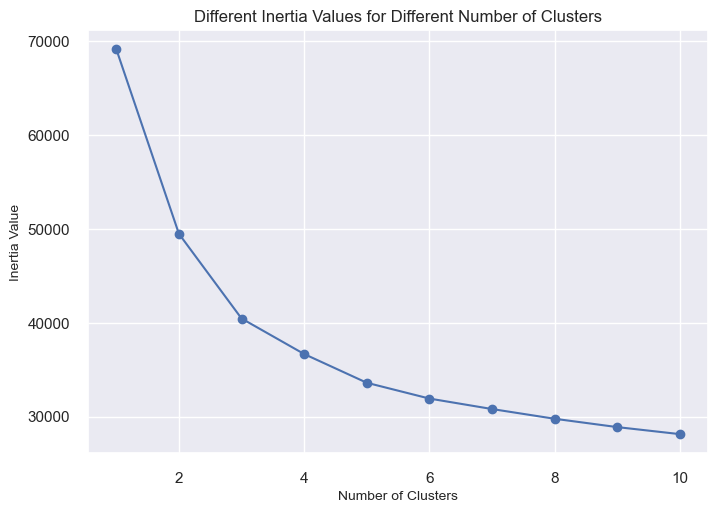

In [590]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [591]:
# Seleccion automatica del numero k
kl = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
kl.elbow

3

In [592]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans = KMeans(n_clusters = 3, **kmeans_constants)
model_kmeans.fit(scaled2w)

KMeans(max_iter=500, n_clusters=3, n_init=100, random_state=42)

In [593]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans.inertia_)
print('Silhouette Score: ', silhouette_score(scaled2w, model_kmeans.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(scaled2w, model_kmeans.labels_))

 ### K-MEANS ###
Inertia:  40446.85658808898


Silhouette Score:  0.24292533811484796
Calinski harabasz score:  1887.2638864856776


In [594]:
# Predicción de los clusters
Cluster_2 = model_kmeans.fit_predict(scaled2w)

df_final['Cluster_2']= Cluster_2
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,Cluster_1,Cluster_2
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1,1
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233,1,1
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233,1,1


In [595]:
df_final.Cluster_2.value_counts()

Cluster_2
0    2366
2    1604
1    1350
Name: count, dtype: int64

### Dataset reducido quantiles


In [596]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(X_pca)
    inertia_list.append(kmeans.inertia_)

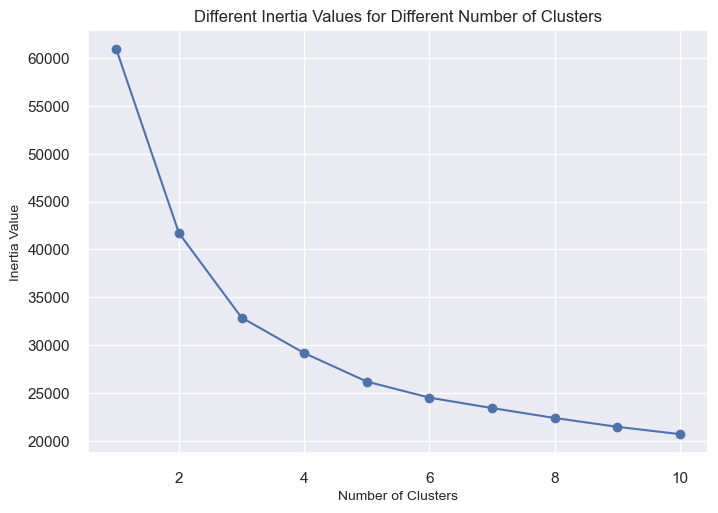

In [597]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [598]:
# Seleccion automatica del numero k
kl = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
kl.elbow

3

In [599]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans_pca = KMeans(n_clusters = 3, **kmeans_constants)
model_kmeans_pca.fit(X_pca)

KMeans(max_iter=500, n_clusters=3, n_init=100, random_state=42)

In [600]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans_pca.inertia_)
print('Silhouette Score: ', silhouette_score(X_pca, model_kmeans_pca.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(X_pca, model_kmeans_pca.labels_))

 ### K-MEANS ###
Inertia:  32883.267503246956


Silhouette Score:  0.2760501898607896
Calinski harabasz score:  2265.3837326169305


In [601]:
# Predicción de los clusters
Cluster_3 = model_kmeans_pca.fit_predict(X_pca)

df_final['Cluster_3']= Cluster_3
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,Cluster_1,Cluster_2,Cluster_3
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1,1,2
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233,1,1,2
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233,1,1,2


In [602]:
df_final['Cluster_3'].value_counts()

Cluster_3
1    2391
0    1581
2    1348
Name: count, dtype: int64

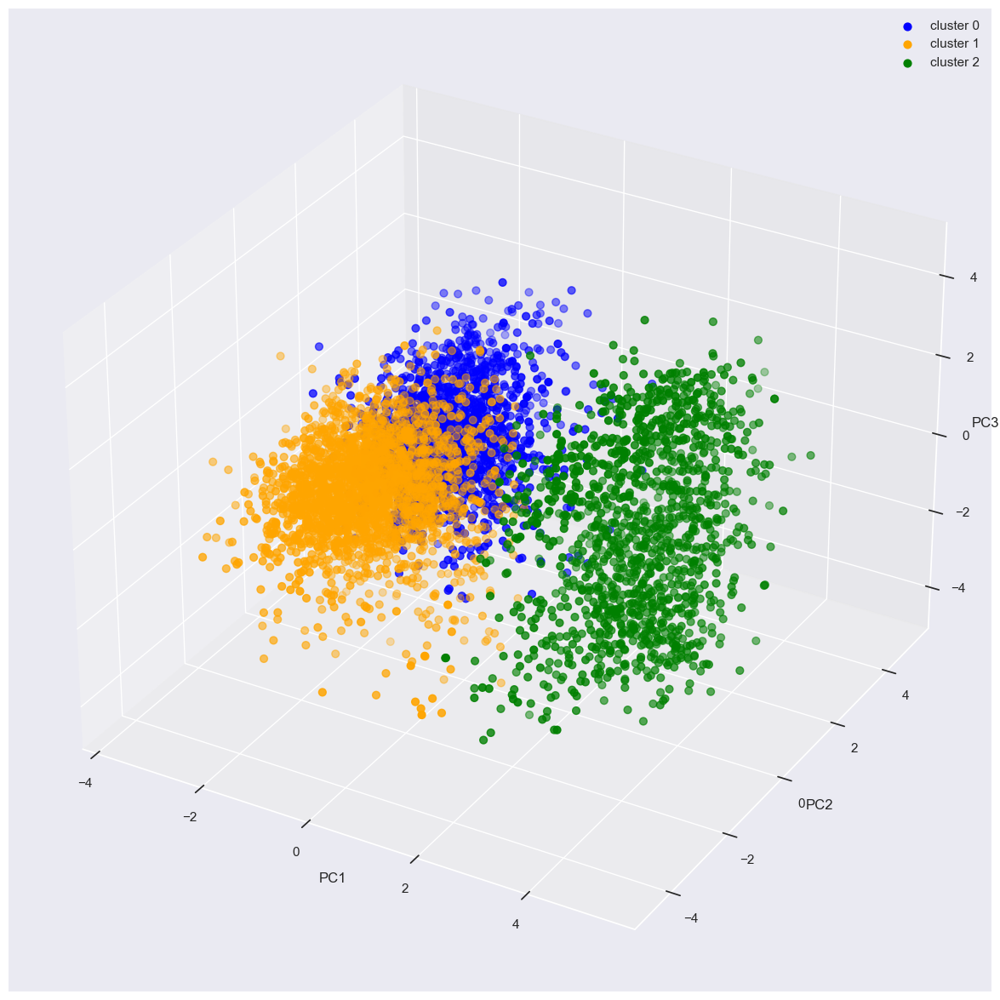

In [603]:
# 3d scatterplot using matplotlib

fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca[Cluster_3 == 0,0],X_pca[Cluster_3 == 0,1],X_pca[Cluster_3 == 0,2], s = 40 , color = 'blue', label = "cluster 0")
ax.scatter(X_pca[Cluster_3 == 1,0],X_pca[Cluster_3 == 1,1],X_pca[Cluster_3 == 1,2], s = 40 , color = 'orange', label = "cluster 1")
ax.scatter(X_pca[Cluster_3 == 2,0],X_pca[Cluster_3 == 2,1],X_pca[Cluster_3 == 2,2], s = 40 , color = 'green', label = "cluster 2")
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.legend()
plt.show()

In [604]:
%pip install plotly
import plotly.express as px

df_temp = pd.DataFrame({'x': X_pca[:, 0], 'y': X_pca[:, 1], 'z': X_pca[:, 2],'label': Cluster_3})
df_temp['label'] = df_temp['label'].astype(str)

fig = px.scatter_3d(df_temp, x="x", y="y", z="z", color="label")
fig.update_layout(width=1000, height=700)
fig.show(config={'displayModeBar': False})

Note: you may need to restart the kernel to use updated packages.


### Dataset reducido winsorizado

In [605]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(W_pca)
    inertia_list.append(kmeans.inertia_)

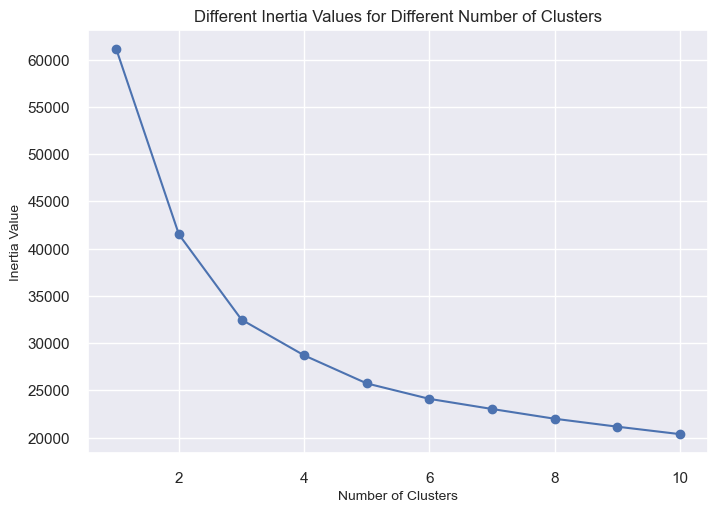

In [606]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [607]:
# Seleccion automatica del numero k
k2 = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
k2.elbow

3

In [608]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans_pca = KMeans(n_clusters = 3, **kmeans_constants)
model_kmeans_pca.fit(W_pca)

KMeans(max_iter=500, n_clusters=3, n_init=100, random_state=42)

In [609]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans_pca.inertia_)
print('Silhouette Score: ', silhouette_score(W_pca, model_kmeans_pca.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(W_pca, model_kmeans_pca.labels_))

 ### K-MEANS ###
Inertia:  32476.174381922363


Silhouette Score:  0.2785554467097112
Calinski harabasz score:  2343.7028113079664


In [610]:
# Predicción de los clusters
Cluster_4 = model_kmeans_pca.fit_predict(W_pca)

df_final['Cluster_4']= Cluster_4
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,Cluster_1,Cluster_2,Cluster_3,Cluster_4
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1,1,2,2
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233,1,1,2,2
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233,1,1,2,2


In [611]:
df_final['Cluster_4'].value_counts()

Cluster_4
0    2338
1    1632
2    1350
Name: count, dtype: int64

In [612]:
df_temp4 = pd.DataFrame({'x': W_pca[:, 0], 'y': W_pca[:, 1], 'z': W_pca[:, 2],'label': Cluster_4})
df_temp4['label'] = df_temp4['label'].astype(str)

fig = px.scatter_3d(df_temp4, x="x", y="y", z="z", color="label")
fig.update_layout(width=1000, height=700)
fig.show(config={'displayModeBar': False})

### Kmeans con el dataset sin reducir, winsorizado, sin la variable color

In [613]:
sincolor = scaled2w.drop(columns=['color'])
sincolor.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,0.217595,2.313302,-2.115235,-0.737525,1.053881,-1.161863,-1.468618,1.197672,1.921114,0.265640,-1.009853,-1.12138
1,0.587157,2.313302,-2.115235,-0.566956,2.090892,-0.285287,-0.857554,0.833633,-0.159077,1.245858,-0.654805,-1.12138
2,0.587157,2.313302,-2.115235,-0.640057,1.808071,-0.911413,-1.098276,0.906441,0.256961,1.000804,-0.654805,-1.12138


In [614]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(sincolor)
    inertia_list.append(kmeans.inertia_)

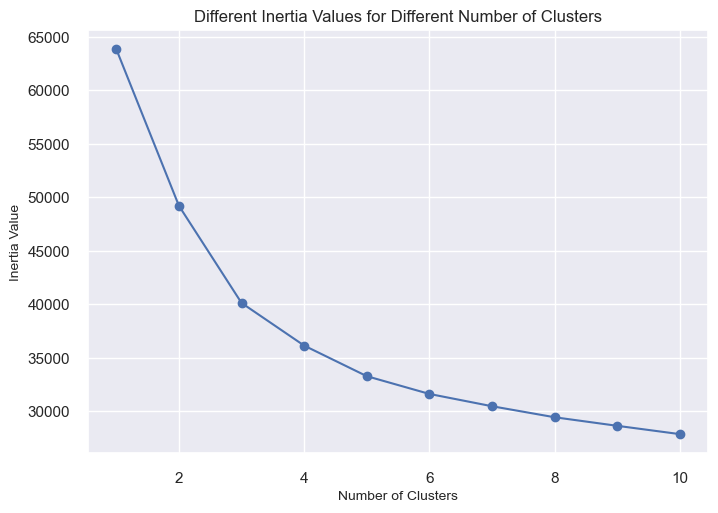

In [615]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [616]:
# Seleccion automatica del numero k
k3 = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
k3.elbow

3

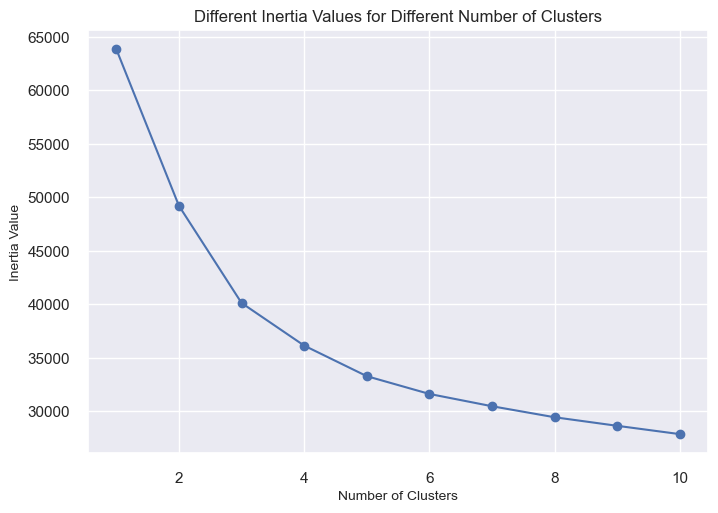

In [617]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [618]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans = KMeans(n_clusters = 3, **kmeans_constants)
model_kmeans.fit(sincolor)

KMeans(max_iter=500, n_clusters=3, n_init=100, random_state=42)

In [619]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans.inertia_)
print('Silhouette Score: ', silhouette_score(sincolor, model_kmeans.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(sincolor, model_kmeans.labels_))

 ### K-MEANS ###
Inertia:  40111.76531038084


Silhouette Score:  0.22764883218988402
Calinski harabasz score:  1572.6436229927606


no mejoró en comparación con el primer modelo

In [620]:
# Predicción de los clusters
Cluster_5 = model_kmeans.fit_predict(sincolor)

df_final['Cluster_5']= Cluster_5
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1,1,2,2,2
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233,1,1,2,2,2
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233,1,1,2,2,2


In [621]:
df_final['Cluster_5'].value_counts()

Cluster_5
0    2349
1    1598
2    1373
Name: count, dtype: int64

### Kmeans con el dataset, winsorizado, sin reducir, sin la variable quality

In [622]:
sincalidad = scaled2w.drop(columns=['quality'])
sincalidad.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,color
0,0.217595,2.313302,-2.115235,-0.737525,1.053881,-1.161863,-1.468618,1.197672,1.921114,0.265640,-1.009853,-1.707233
1,0.587157,2.313302,-2.115235,-0.566956,2.090892,-0.285287,-0.857554,0.833633,-0.159077,1.245858,-0.654805,-1.707233
2,0.587157,2.313302,-2.115235,-0.640057,1.808071,-0.911413,-1.098276,0.906441,0.256961,1.000804,-0.654805,-1.707233


In [623]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(sincalidad)
    inertia_list.append(kmeans.inertia_)

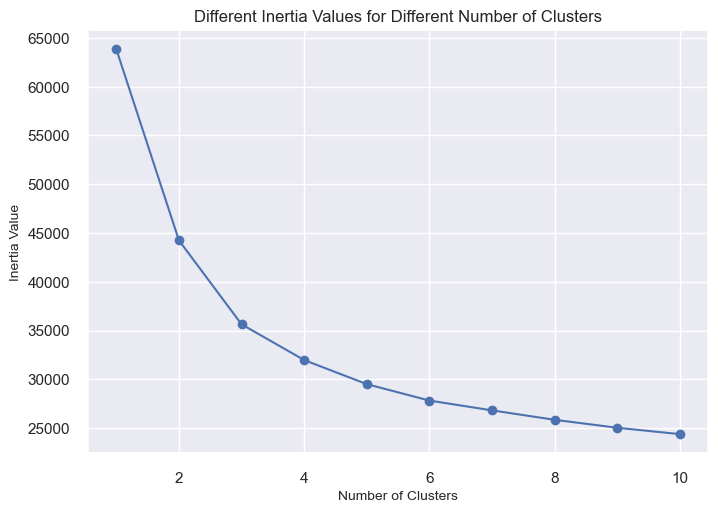

In [624]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [625]:
# Seleccion automatica del numero k
k4 = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
k4.elbow

3

In [626]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans = KMeans(n_clusters = 3, **kmeans_constants)
model_kmeans.fit(sincalidad)

KMeans(max_iter=500, n_clusters=3, n_init=100, random_state=42)

In [627]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans.inertia_)
print('Silhouette Score: ', silhouette_score(sincalidad, model_kmeans.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(sincalidad, model_kmeans.labels_))

 ### K-MEANS ###
Inertia:  35637.4332553001


Silhouette Score:  0.2619448128407548
Calinski harabasz score:  2103.869915480917


mejoró en todas las metricas

In [628]:
# Predicción de los clusters
Cluster_6 = model_kmeans.fit_predict(sincalidad)

df_final['Cluster_6']= Cluster_6
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1,1,2,2,2,0
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233,1,1,2,2,2,0
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233,1,1,2,2,2,0


In [629]:
df_final['Cluster_6'].value_counts()

Cluster_6
1    2480
2    1485
0    1355
Name: count, dtype: int64

### Kmeans con el dataset winsorizado, sin reducir, sin las variables color y calidad

In [630]:
sincyq = scaled2w.drop(columns=['quality','color'])
sincyq.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,0.217595,2.313302,-2.115235,-0.737525,1.053881,-1.161863,-1.468618,1.197672,1.921114,0.265640,-1.009853
1,0.587157,2.313302,-2.115235,-0.566956,2.090892,-0.285287,-0.857554,0.833633,-0.159077,1.245858,-0.654805
2,0.587157,2.313302,-2.115235,-0.640057,1.808071,-0.911413,-1.098276,0.906441,0.256961,1.000804,-0.654805


In [631]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(sincyq)
    inertia_list.append(kmeans.inertia_)

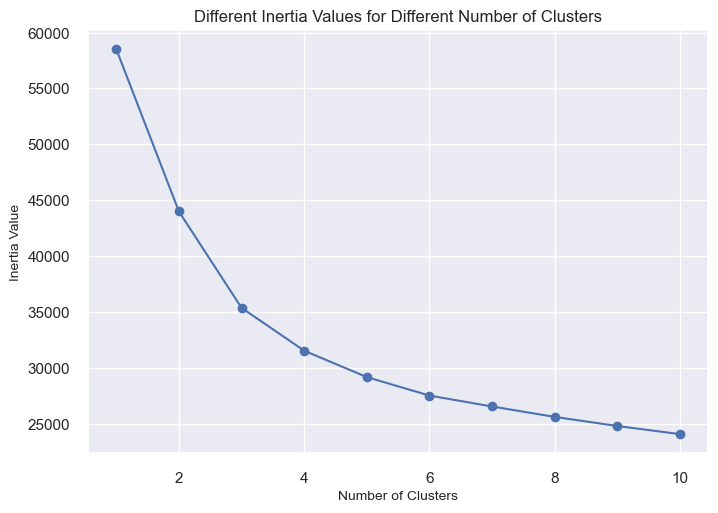

In [632]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [633]:
# Seleccion automatica del numero k
k4 = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
k4.elbow

4

In [634]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans = KMeans(n_clusters = 4, **kmeans_constants)
model_kmeans.fit(sincyq)

KMeans(max_iter=500, n_clusters=4, n_init=100, random_state=42)

In [635]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans.inertia_)
print('Silhouette Score: ', silhouette_score(sincyq, model_kmeans.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(sincyq, model_kmeans.labels_))

 ### K-MEANS ###
Inertia:  31538.51894415532


Silhouette Score:  0.2468533814843712
Calinski harabasz score:  1515.9616250723493


Identifica como numero adecuado de clústeres 4. Desmejoran las métricas del score de silueta y calinski, hay un breve aumento en la inercia.

In [636]:
# Predicción de los clusters
Cluster_7 = model_kmeans.fit_predict(sincyq)

df_final['Cluster_7']= Cluster_7
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,-0.969388,-0.937379,-1.707233,1,1,2,2,2,0,3
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,-0.631951,-0.937379,-1.707233,1,1,2,2,2,0,3
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,-0.631951,-0.937379,-1.707233,1,1,2,2,2,0,3


In [637]:
df_final['Cluster_7'].value_counts()

Cluster_7
1    2410
0    1455
3     810
2     645
Name: count, dtype: int64

# Reducción de la dimensionalidad del dataset winsorizado sin la variable calidad.

Este será nuestro nuevo dataset

In [638]:
#Cree un dataset reducido que proporcione el 85% de la varianza de entrada que debe explicarse
pcawc = PCA(n_components=0.85).fit(sincalidad)

#Veamos cuántas componentes ha conservado PCA:
pcawc.n_components_

6

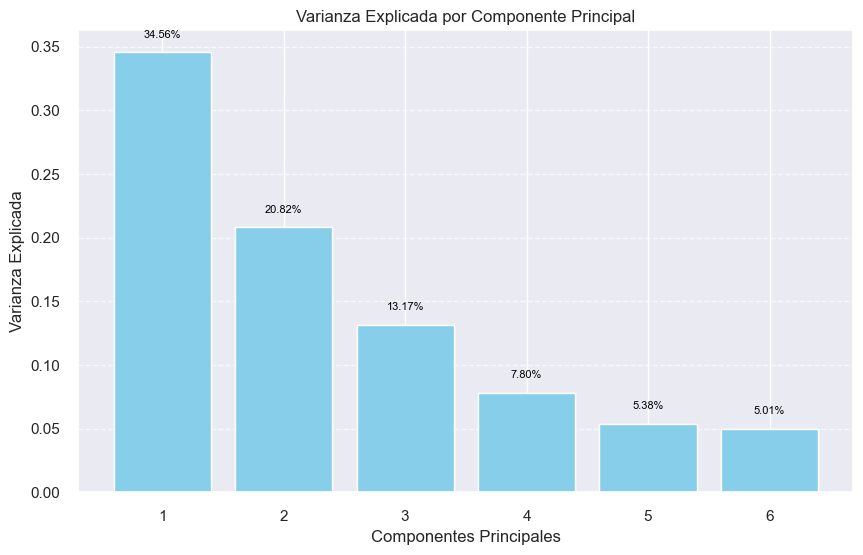

In [639]:
# Obtén la varianza explicada por cada componente
variance_explained = pcawc.explained_variance_ratio_

# Calcula el número de componentes
n_components = pcawc.n_components_

# Crea un array con los índices de los componentes (para el eje x del gráfico)
component_indices = np.arange(1, n_components + 1)

# Crea el gráfico de barras para la varianza explicada por cada componente
plt.figure(figsize=(10, 6))
bars = plt.bar(component_indices, variance_explained, color='skyblue')
plt.bar(component_indices, variance_explained, color='skyblue')
plt.xlabel('Componentes Principales')
plt.ylabel('Varianza Explicada')
plt.title('Varianza Explicada por Componente Principal')

# Agregar etiquetas con el porcentaje de varianza sobre cada barra
for bar, var_explained in zip(bars, variance_explained):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f'{var_explained*100:.2f}%', ha='center', va='bottom',fontsize=8, color='black')

plt.xticks(component_indices)  # Mostrar todos los componentes en el eje x
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Añadir líneas de cuadrícula en el eje y
plt.show()

In [640]:
#Por último, transforme "scaled1q" de 13 columnas X_pca
C_pca = pcawc.fit_transform(sincalidad)
C_pca

array([[ 4.0833995 , -0.20474025, -2.49511901, -0.65763213,  0.15053695,
        -0.37023253],
       [ 3.84934167,  0.62499485, -1.4457507 , -0.74415115, -0.18830105,
         1.72291748],
       [ 4.0694872 ,  0.27037788, -1.50726527, -0.89051826, -0.17085243,
         1.03327901],
       ...,
       [-1.10920503, -0.49573019,  0.01466961, -1.34742094,  1.15570397,
         0.64099435],
       [-1.42884745, -3.26011305, -0.24386743, -0.12328205, -0.10186138,
        -0.53109472],
       [-1.68061622, -2.61371321,  0.49732277, -0.37131447,  0.54767288,
        -0.7589406 ]])

In [641]:
# --- Pesos de las variables que componen las componentes principales ---
pesos_pca = pd.DataFrame(pcawc.components_, columns = sincalidad.columns,
             index = ['PC 1', 'PC 2', 'PC 3','PC 4', 'PC 5', 'PC 6']).round(2).T

pesos_pca

,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6
fixed_acidity,0.26,0.23,0.48,-0.11,-0.08,0.07
volatile_acidity,0.36,0.02,-0.25,-0.27,-0.30,0.36
citric_acid,-0.12,0.19,0.59,0.31,0.13,-0.21
residual_sugar,-0.21,0.42,-0.15,-0.06,-0.62,-0.31
chlorides,0.38,0.22,-0.04,-0.01,0.31,0.20
free_sulfur_dioxide,-0.32,0.23,-0.17,0.26,0.02,0.52
total_sulfur_dioxide,-0.38,0.25,-0.14,0.14,0.07,0.30
density,0.21,0.54,-0.11,0.03,-0.12,-0.24
pH,0.17,-0.19,-0.46,0.50,0.10,-0.42
sulphates,0.28,0.06,0.09,0.68,-0.22,0.26


# Kmeans con el nuevo dataset reducido.

In [642]:
# Número optimo de K
inertia_list = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=3)
    kmeans.fit(C_pca)
    inertia_list.append(kmeans.inertia_)

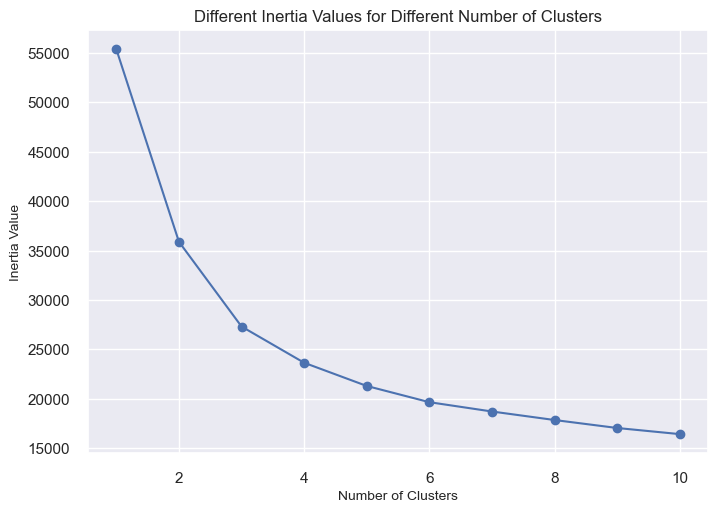

In [643]:
# plot the inertia curve
plt.plot(range(1,11),inertia_list)
plt.scatter(range(1,11),inertia_list)
plt.xlabel("Number of Clusters", size=10)
plt.ylabel("Inertia Value", size=10)
plt.title("Different Inertia Values for Different Number of Clusters", size=12)
plt.show()

In [644]:
# Seleccion automatica del numero k
k2 = KneeLocator(range(1, 11),
                 inertia_list, curve="convex",
                 direction="decreasing")
k2.elbow

3

In [645]:
kmeans_constants = {"init": "k-means++", "n_init": 100, "max_iter": 500, "random_state": 42}

# --- Modelo K-means ---
model_kmeans_pca = KMeans(n_clusters = 3, **kmeans_constants)
model_kmeans_pca.fit(C_pca)

KMeans(max_iter=500, n_clusters=3, n_init=100, random_state=42)

In [646]:
# --- Evaluación del modelo kmeans ---
print(" ### K-MEANS ###")
print('Inertia: ', model_kmeans_pca.inertia_)
print('Silhouette Score: ', silhouette_score(C_pca, model_kmeans_pca.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(C_pca, model_kmeans_pca.labels_))

 ### K-MEANS ###
Inertia:  27316.75329608244


Silhouette Score:  0.3076323282444527
Calinski harabasz score:  2730.6901396095036


In [647]:
# Predicción de los clusters
Cluster_8 =  model_kmeans_pca.fit_predict(C_pca)

df_final['Cluster_8']= Cluster_8
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,quality,color,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,-0.937379,-1.707233,1,1,2,2,2,0,3,1
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,-0.937379,-1.707233,1,1,2,2,2,0,3,1
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,-0.937379,-1.707233,1,1,2,2,2,0,3,1


In [648]:
df_final['Cluster_8'].value_counts()

Cluster_8
0    2474
2    1493
1    1353
Name: count, dtype: int64

In [649]:
df_temp8 = pd.DataFrame({'x': C_pca[:, 0], 'y': C_pca[:, 1], 'z': C_pca[:, 2],'label': Cluster_8})
df_temp8['label'] = df_temp8['label'].astype(str)

fig = px.scatter_3d(df_temp8, x="x", y="y", z="z", color="label")
fig.update_layout(width=1000, height=700)
fig.show(config={'displayModeBar': False})

# Clustering Algorithm: Hierarchical Clustering

### Hierarchical Clustering con nuevo dataset  sin reducir

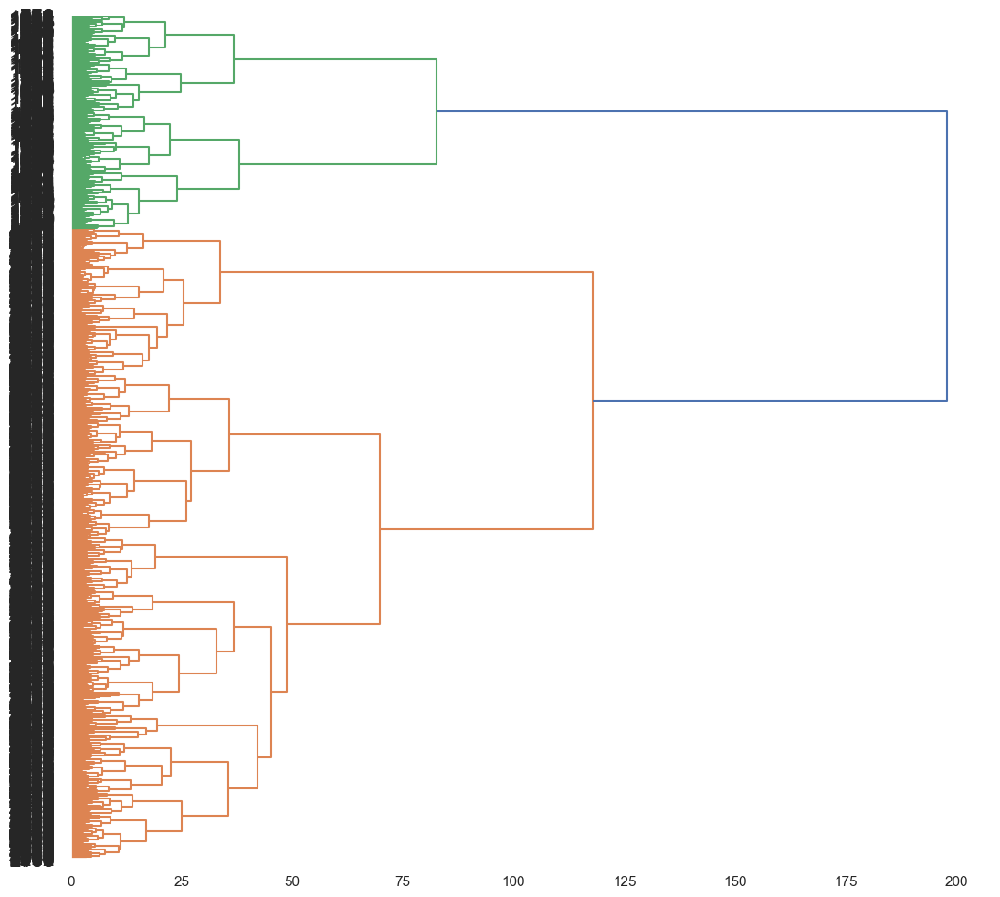

In [650]:
from scipy.cluster.hierarchy import dendrogram, linkage
# Estilo de las gráficas
sns.set_theme()

# Función de vinculación para agrupar datos según similud
Z = linkage(sincalidad, method='ward')

plt.figure(figsize=(13, 12))
dendrogram(
    Z,
    orientation='right',
    distance_sort='descending',
    show_leaf_counts=False,
    leaf_font_size=16
)
plt.show()

In [651]:
from sklearn.cluster import AgglomerativeClustering

model_hc = AgglomerativeClustering(n_clusters = 2, metric = 'euclidean', linkage = 'ward')
model_hc.fit(sincalidad)

# --- Evaluación del modelo kmeans ---
print(" ### HIERARCHICAL CLUSTERING ###")
print('Silhouette Score: ', silhouette_score(sincalidad, model_hc.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(sincalidad, model_hc.labels_))

 ### HIERARCHICAL CLUSTERING ###
Silhouette Score:  0.33747785128593294
Calinski harabasz score:  2352.507033274485


In [652]:
# Predicción de los clusters
Cluster_9 = model_hc.fit_predict(sincalidad)

df_final['Cluster_9']= Cluster_9

df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,color,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,-1.707233,1,1,2,2,2,0,3,1,1
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,-1.707233,1,1,2,2,2,0,3,1,1
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,-1.707233,1,1,2,2,2,0,3,1,1


In [653]:
df_final['Cluster_9'].value_counts()

Cluster_9
0    3975
1    1345
Name: count, dtype: int64

### Hierarchical Clustering con el nuevo dataset  reducido

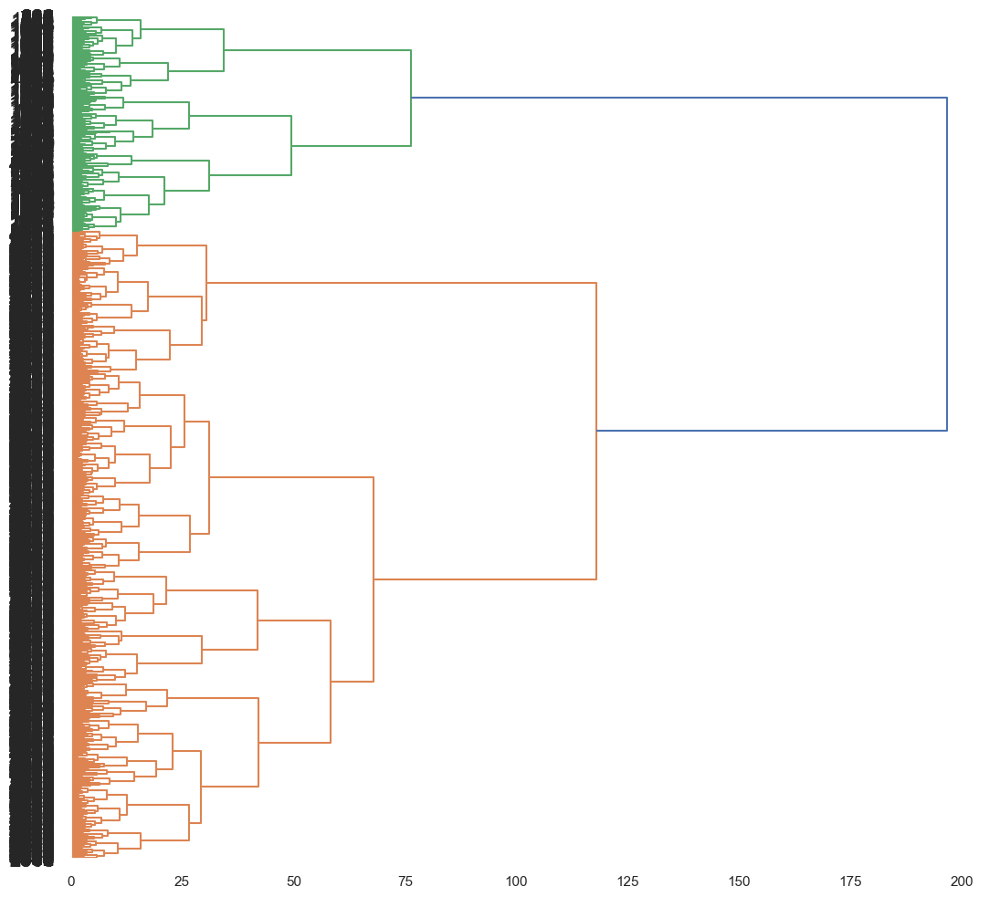

In [654]:
from scipy.cluster.hierarchy import dendrogram, linkage
# Estilo de las gráficas
sns.set_theme()

# Función de vinculación para agrupar datos según similud
X = linkage(C_pca, method='ward')

plt.figure(figsize=(13, 12))
dendrogram(
    X,
    orientation='right',
    distance_sort='descending',
    show_leaf_counts=False,
    leaf_font_size=16
)
plt.show()

In [655]:
model_hc2 = AgglomerativeClustering(n_clusters = 2, metric = 'euclidean', linkage = 'ward')
model_hc2.fit(C_pca)

# --- Evaluación del modelo kmeans ---
print(" ### HIERARCHICAL CLUSTERING ###")
print('Silhouette Score: ', silhouette_score(C_pca, model_hc2.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(C_pca, model_hc2.labels_))

 ### HIERARCHICAL CLUSTERING ###
Silhouette Score:  0.3787656655105836
Calinski harabasz score:  2852.2764473036373


In [656]:
# Predicción de los clusters
Cluster_10 = model_hc2.fit_predict(C_pca)

df_final['Cluster_10']= Cluster_10

df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_1,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,1,1,2,2,2,0,3,1,1,1
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,1,1,2,2,2,0,3,1,1,1
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,1,1,2,2,2,0,3,1,1,1


In [657]:
df_final['Cluster_10'].value_counts()

Cluster_10
0    3959
1    1361
Name: count, dtype: int64

In [658]:
df_temp10 = pd.DataFrame({'x': C_pca[:, 0], 'y': C_pca[:, 1], 'z': C_pca[:, 2],'label': Cluster_10})
df_temp10['label'] = df_temp10['label'].astype(str)

fig = px.scatter_3d(df_temp10, x="x", y="y", z="z", color="label")
fig.update_layout(width=1000, height=700)
fig.show(config={'displayModeBar': False})

# Clustering Algorithm: DBSCAN

### DBSCAN con el nuevo dataset sin reducir

In [659]:
from sklearn.neighbors import NearestNeighbors

# --- Selección de hiperparámetros eps ---

# --- Gráfica de distancias K --
neighbors = NearestNeighbors(n_neighbors = 2)
neighbors.fit(sincalidad)

distances, *other = neighbors.kneighbors(sincalidad)
distances = distances[:, 1]
print(distances.shape)
distances = np.sort(distances, axis = 0)

(5320,)


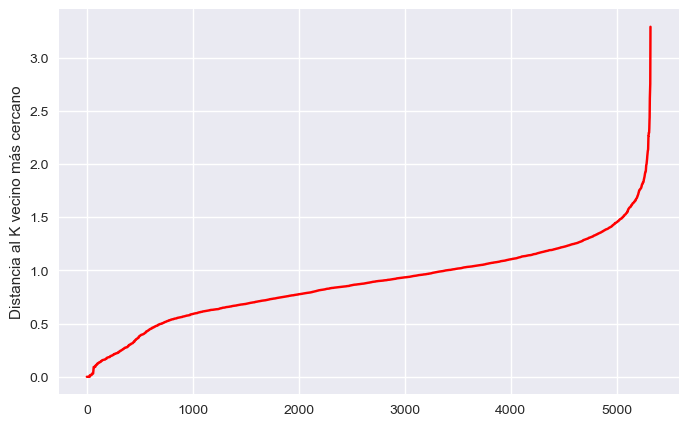

In [660]:
plt.style.use('seaborn')
plt.figure(figsize = (8, 5))
plt.plot(distances, color = 'red')
plt.ylabel('Distancia al K vecino más cercano')
plt.show()

In [661]:
# --- Selección del punto de curvatura máxima ---
kl = KneeLocator(range(len(distances)), distances, curve = 'convex', direction = 'increasing')
kl.elbow

5306

In [662]:
# --- Epsilon óptimo --
epsilon = distances[kl.elbow]
epsilon

2.2929758607378514

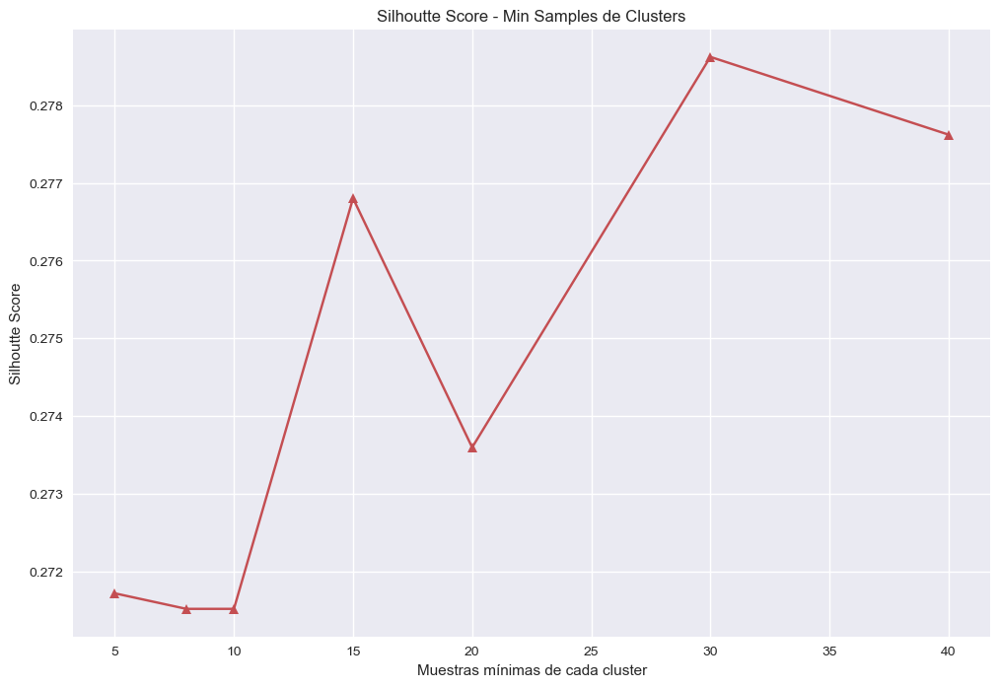

In [663]:
# --- Selección de hiperparámetros min_sample ---
silhoutte_coefs = []

for min_points in [5, 8, 10, 15, 20, 30, 40]:
    model_d = DBSCAN(eps = epsilon, min_samples = min_points)
    model_d.fit(sincalidad)
    silhoutte_coefs.append(silhouette_score(sincalidad, model_d.labels_))

plt.figure(figsize = (12, 8))
plt.plot([5, 8, 10, 15, 20, 30, 40], silhoutte_coefs, color = 'r', marker = '^')
plt.xlabel('Muestras mínimas de cada cluster')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Min Samples de Clusters')
plt.show()

In [664]:
# --- Modelo DBSCAN ---
model_db = DBSCAN(eps = epsilon, min_samples = 30, n_jobs=-1)
model_db.fit(sincalidad)

DBSCAN(eps=2.2929758607378514, min_samples=30, n_jobs=-1)

In [665]:
# --- Evaluación del modelo DBSCAN ---
print(" ### DBSCAN ###")
print('Silhouette Score: ', silhouette_score(sincalidad, model_db.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(sincalidad, model_db.labels_))

 ### DBSCAN ###


Silhouette Score:  0.2786239153837832
Calinski harabasz score:  1194.0860552369984


In [666]:
# Predicción de los clusters
Cluster_11 = model_db.fit_predict(sincalidad)

df_final['Cluster_11']= Cluster_11
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_2,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,1,2,2,2,0,3,1,1,1,0
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,1,2,2,2,0,3,1,1,1,0
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,1,2,2,2,0,3,1,1,1,0


In [667]:
df_final['Cluster_11'].value_counts()

Cluster_11
 1    3932
 0    1338
-1      50
Name: count, dtype: int64

### DBSCAN con el nuevo dataset reducido

In [668]:
# --- Selección de hiperparámetros eps ---

# --- Gráfica de distancias K --
neighbors = NearestNeighbors(n_neighbors = 2)
neighbors.fit(C_pca)

distances, *other = neighbors.kneighbors(C_pca)
distances = distances[:, 1]
print(distances.shape)
distances = np.sort(distances, axis = 0)
distances

(5320,)


array([0.        , 0.        , 0.        , ..., 2.03290848, 2.27605353,
       2.27888548])

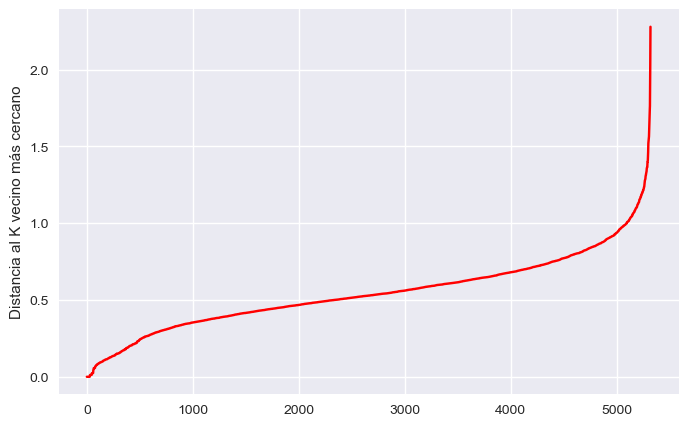

In [669]:
plt.style.use('seaborn')
plt.figure(figsize = (8, 5))
plt.plot(distances, color = 'red')
plt.ylabel('Distancia al K vecino más cercano')
plt.show()

In [670]:
# --- Selección del punto de curvatura máxima ---
k2 = KneeLocator(range(len(distances)), distances, curve = 'convex', direction = 'increasing')
k2.elbow

5289

In [671]:
# --- Epsilon óptimo --
epsilon = distances[k2.elbow]
epsilon

1.3652740148853375

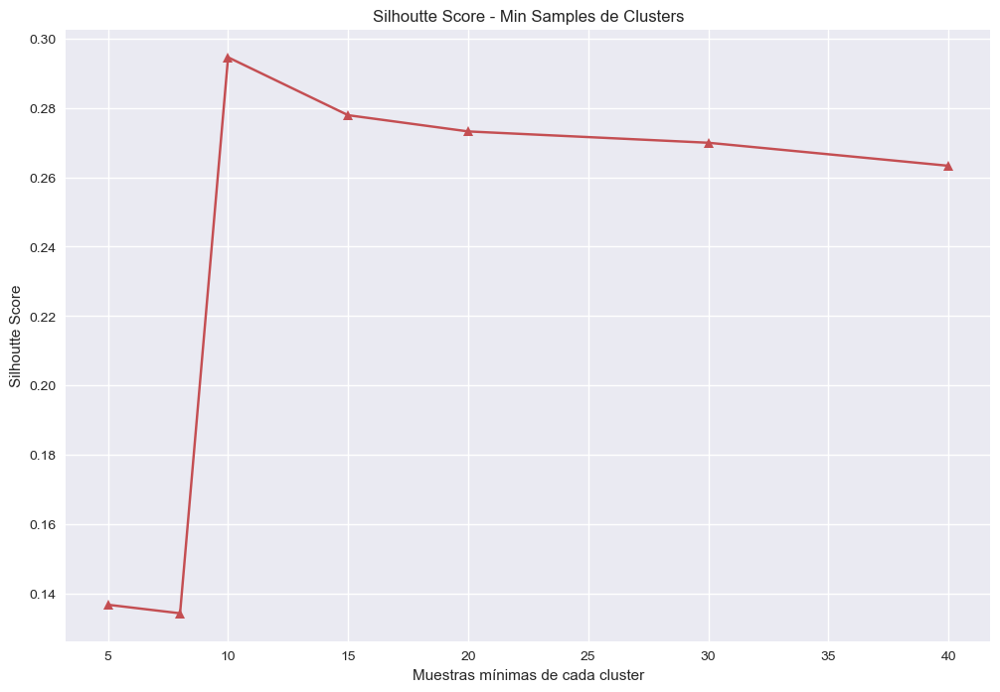

In [672]:
# --- Selección de hiperparámetros min_sample ---
silhoutte_coefs2 = []

for min_points in [5, 8, 10, 15, 20, 30, 40]:
    model_d = DBSCAN(eps = epsilon, min_samples = min_points)
    model_d.fit(C_pca)
    silhoutte_coefs2.append(silhouette_score(C_pca, model_d.labels_))

plt.figure(figsize = (12, 8))
plt.plot([5, 8, 10, 15, 20, 30, 40], silhoutte_coefs2, color = 'r', marker = '^')
plt.xlabel('Muestras mínimas de cada cluster')
plt.ylabel('Silhoutte Score')
plt.title('Silhoutte Score - Min Samples de Clusters')
plt.show()

In [673]:
# --- Modelo DBSCAN ---
model_db_pca = DBSCAN(eps = epsilon, min_samples = 10)
model_db_pca.fit(C_pca)

DBSCAN(eps=1.3652740148853375, min_samples=10)

In [674]:
# --- Evaluación del modelo DBSCAN ---
print(" ### DBSCAN ###")
print('Silhouette Score: ', silhouette_score(C_pca, model_db_pca.labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(C_pca, model_db_pca.labels_))

 ### DBSCAN ###


Silhouette Score:  0.2946161417045652
Calinski harabasz score:  1456.5631691139367


In [675]:
# Predicción de los clusters
Cluster_12 = model_db_pca.fit_predict(C_pca)

df_final['Cluster_12']= Cluster_12
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_3,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,2,2,2,0,3,1,1,1,0,0
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,2,2,2,0,3,1,1,1,0,0
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,2,2,2,0,3,1,1,1,0,0


In [676]:
df_final['Cluster_12'].value_counts()

Cluster_12
 1    3885
 0    1328
-1     107
Name: count, dtype: int64

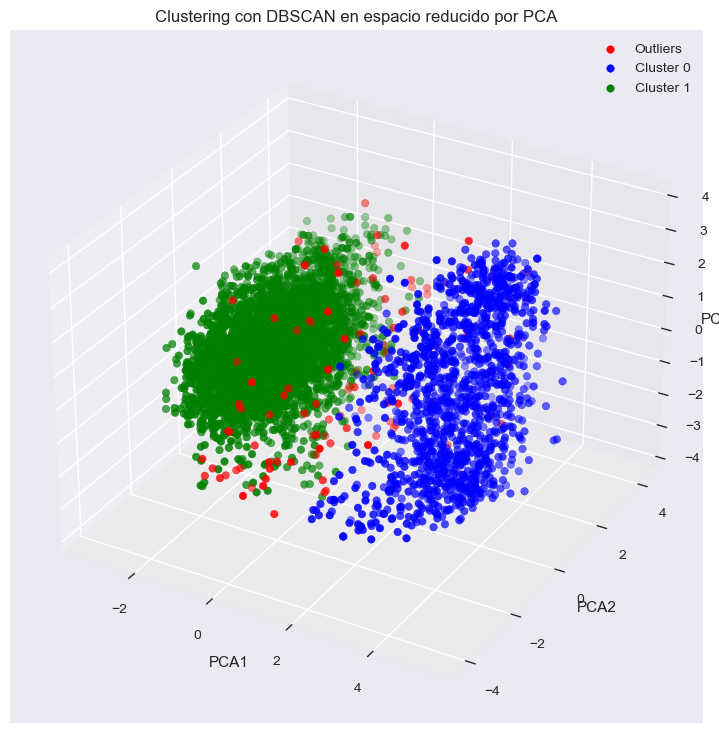

In [677]:
from mpl_toolkits.mplot3d import Axes3D

# Obtener las etiquetas de clúster asignadas por DBSCAN
labels = model_db_pca.labels_

# Obtener las coordenadas PCA reducidas (asumiendo X_pca tiene 3 componentes principales)
x = C_pca[:, 0]
y = C_pca[:, 1]
z = C_pca[:, 2]

# Crear una figura 3D
fig = plt.figure(figsize=(10, 9))
ax = fig.add_subplot(111, projection='3d')

# Colorear los puntos por clúster
for label in np.unique(labels):
    if label == 0:
        # Pintar los puntos del cluster 0 en verde
        ax.scatter(x[labels == label], y[labels == label], z[labels == label], color= 'blue', s=30, label='Cluster 0')
    elif label == 1:
        # Pintar los puntos del cluster 1 en azul
        ax.scatter(x[labels == label], y[labels == label], z[labels == label], color='green', s=30, label='Cluster 1')
    else:
        # Pintar los outliers (cluster -1) en naranja
        ax.scatter(x[labels == label], y[labels == label], z[labels == label], color='red', s=30, label='Outliers')

# Configurar etiquetas y título
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')
ax.set_title('Clustering con DBSCAN en espacio reducido por PCA')

# Mostrar leyenda
ax.legend()

# Mostrar el gráfico
plt.show()

In [678]:
df_temp12 = pd.DataFrame({'x': C_pca[:, 0], 'y': C_pca[:, 1], 'z': C_pca[:, 2],'label': Cluster_12})
df_temp12['label'] = df_temp12['label'].astype(str)
fig = px.scatter_3d(df_temp12, x="x", y="y", z="z", color="label")
fig.update_layout(width=1000, height=700)
fig.show(config={'displayModeBar': False})

# Clustering Algorithm: Gaussian Mixture Model

### GMM con el nuevo dataset sin reducir

Text(0.5, 0, 'Número de Clusters')

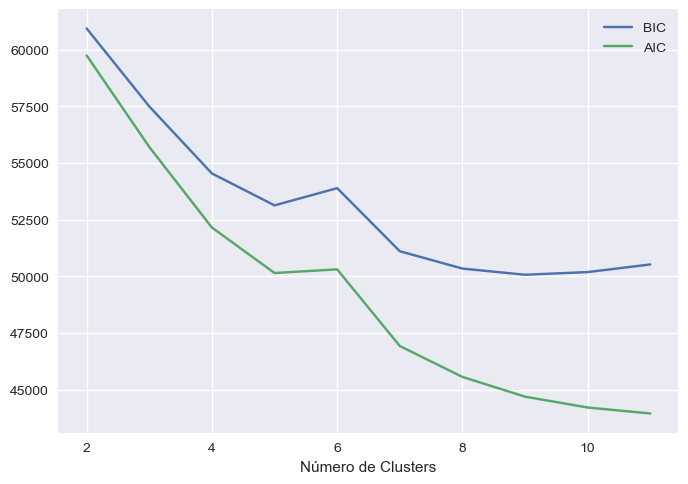

In [679]:
# --- Estimación de hiperparámetros ---
n_components = np.arange(2, 12)

models_g = [GaussianMixture(n_components=n, random_state=123).fit(sincalidad) for n in n_components]

plt.plot(n_components, [m.bic(sincalidad) for m in models_g], label="BIC")
plt.plot(n_components, [m.aic(sincalidad) for m in models_g], label="AIC")
plt.legend()
plt.xlabel("Número de Clusters")

In [680]:
# --- Modelo GMM ---
model_gmm = GaussianMixture(n_components=5, random_state=123, covariance_type = 'tied').fit(sincalidad)

In [681]:
# --- Evaluación del modelo GMM ---
labels_ = model_gmm.predict(sincalidad)

print(" ### GMM ###")
print('Silhouette Score: ', silhouette_score(sincalidad, labels_))
print('Calinski harabasz score: ', calinski_harabasz_score(sincalidad, labels_))

 ### GMM ###
Silhouette Score:  0.1728175577741183
Calinski harabasz score:  1261.4496707856517


In [682]:
# Predicción de los clusters
Cluster_13 = model_gmm.fit_predict(sincalidad)

df_final['Cluster_13']= Cluster_13
df_final.head(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_4,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,2,2,0,3,1,1,1,0,0,1
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,2,2,0,3,1,1,1,0,0,1
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,2,2,0,3,1,1,1,0,0,1


In [683]:
df_final['Cluster_13'].value_counts()

Cluster_13
1    1359
2    1282
4    1080
0     845
3     754
Name: count, dtype: int64

### GMM con el nuevo dataset reducido

Text(0.5, 0, 'Número de Clusters')

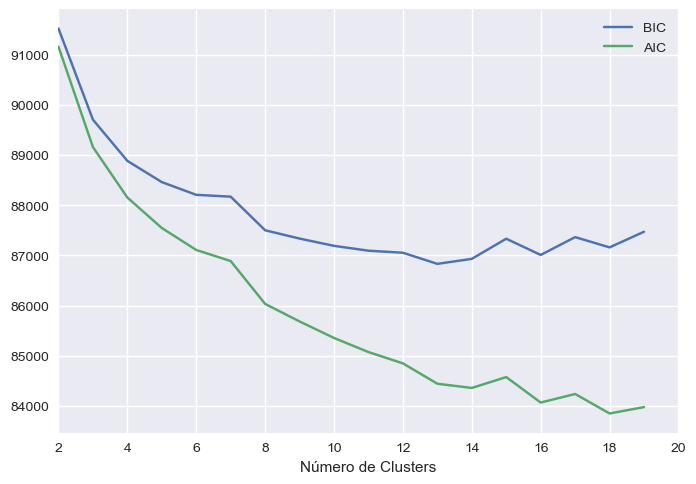

In [684]:
# --- Estimación de hiperparámetros ---
n_components2 = np.arange(2, 20)

models_g2 = [GaussianMixture(n_components=n, random_state=123).fit(C_pca) for n in n_components2]

plt.plot(n_components2, [m.bic(C_pca) for m in models_g2], label="BIC")
plt.plot(n_components2, [m.aic(C_pca) for m in models_g2], label="AIC")
plt.legend()
plt.xlim([2,20])
plt.xlabel("Número de Clusters")

In [685]:
# --- Modelo GMM ---
model_gmm_pca = GaussianMixture(n_components= 4, random_state=123, covariance_type = 'tied').fit(C_pca)

In [686]:
# --- Evaluación del modelo GMM ---
labels_2 = model_gmm_pca.predict(C_pca)

print(" ### GMM ###")
print('Silhouette Score: ', silhouette_score(C_pca, labels_2))
print('Calinski harabasz score: ', calinski_harabasz_score(C_pca, labels_2))

 ### GMM ###
Silhouette Score:  0.22807984053744462
Calinski harabasz score:  2059.4255204322353


In [727]:
# Predicción de los clusters
Cluster_14 = model_gmm_pca.fit_predict(C_pca)

df_final['Cluster_14']= Cluster_14
df_final.head(5)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,2,0,3,1,1,1,0,0,1,2
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,2,0,3,1,1,1,0,0,1,2
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,2,0,3,1,1,1,0,0,1,2
3,2.302554,-0.386644,1.757397,-0.724004,0.973630,-0.759895,-0.957209,1.197786,-0.405096,0.393614,...,2,0,2,1,1,1,0,0,1,2
4,0.238055,2.164647,-2.273272,-0.747483,0.973630,-0.996285,-1.311627,1.128801,1.812423,0.240980,...,2,0,3,1,1,1,0,0,1,2


In [688]:
df_final['Cluster_14'].value_counts()

Cluster_14
1    1352
2    1351
0    1317
3    1300
Name: count, dtype: int64

In [689]:
df_temp14 = pd.DataFrame({'x': C_pca[:, 0], 'y': C_pca[:, 1], 'z': C_pca[:, 2],'label': Cluster_14})
df_temp14['label'] = df_temp14['label'].astype(str)
fig = px.scatter_3d(df_temp14, x="x", y="y", z="z", color="label")
fig.update_layout(width=1000, height=700)
fig.show(config={'displayModeBar': False})

In [740]:
dffinal =  df_final.copy( )

In [725]:
dffinal.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,2,0,3,1,1,1,0,0,1,2
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,2,0,3,1,1,1,0,0,1,2
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,2,0,3,1,1,1,0,0,1,2
3,2.302554,-0.386644,1.757397,-0.724004,0.973630,-0.759895,-0.957209,1.197786,-0.405096,0.393614,...,2,0,2,1,1,1,0,0,1,2
4,0.238055,2.164647,-2.273272,-0.747483,0.973630,-0.996285,-1.311627,1.128801,1.812423,0.240980,...,2,0,3,1,1,1,0,0,1,2


In [726]:
df_final.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14
0,0.238055,2.298926,-2.273272,-0.724004,1.019157,-1.114479,-1.417952,1.128801,1.812423,0.240980,...,2,0,3,1,1,1,0,0,1,2
1,0.605077,2.298926,-2.273272,-0.559650,2.020762,-0.287116,-0.833163,0.783878,-0.151665,1.156786,...,2,0,3,1,1,1,0,0,1,2
2,0.605077,2.298926,-1.985367,-0.630087,1.747597,-0.878090,-1.063534,0.852863,0.228481,0.927835,...,2,0,3,1,1,1,0,0,1,2
3,2.302554,-0.386644,1.757397,-0.724004,0.973630,-0.759895,-0.957209,1.197786,-0.405096,0.393614,...,2,0,2,1,1,1,0,0,1,2
4,0.238055,2.164647,-2.273272,-0.747483,0.973630,-0.996285,-1.311627,1.128801,1.812423,0.240980,...,2,0,3,1,1,1,0,0,1,2


# Interpretación de clústers

In [741]:
# Conversión de variables numéricas a valores originales
train_cols = dffinal[['fixed_acidity',	'volatile_acidity','citric_acid','residual_sugar','chlorides','free_sulfur_dioxide','total_sulfur_dioxide','density','pH','sulphates','alcohol','quality','color']]
scaled_train_df1 = pd.DataFrame(scaler.inverse_transform(train_cols), columns = train_cols.columns)
scaled_train_df1.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,color
0,7.422145,0.677879,0.019506,1.955491,0.075263,11.756784,36.736197,0.997611,3.484325,0.556981,9.445588,5.133889,0.255451
1,7.819396,0.677879,0.019506,2.629984,0.096512,24.970788,68.317244,0.996663,3.201069,0.669096,9.825748,5.133889,0.255451
2,7.819396,0.677879,0.056841,2.340916,0.090717,15.532214,55.876225,0.996853,3.255893,0.641067,9.825748,5.133889,0.255451
3,9.656681,0.281574,0.542191,1.955491,0.074297,17.419929,61.618234,0.997800,3.164520,0.575667,9.825748,6.004814,0.255451
4,7.422145,0.658063,0.019506,1.859135,0.074297,13.644499,42.478205,0.997611,3.484325,0.556981,9.445588,5.133889,0.255451


In [743]:
# Obtener las columnas correspondientes del DataFrame 1
columnas_correspondientes = dffinal.columns.intersection(scaled_train_df1.columns)

# Reemplazar las columnas correspondientes del DataFrame 1 con las del DataFrame 2
dffinal.loc[:, columnas_correspondientes] = scaled_train_df1.loc[:, columnas_correspondientes]
dffinal.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,...,Cluster_5,Cluster_6,Cluster_7,Cluster_8,Cluster_9,Cluster_10,Cluster_11,Cluster_12,Cluster_13,Cluster_14
0,7.422145,0.677879,0.019506,1.955491,0.075263,11.756784,36.736197,0.997611,3.484325,0.556981,...,2,0,3,1,1,1,0,0,1,2
1,7.819396,0.677879,0.019506,2.629984,0.096512,24.970788,68.317244,0.996663,3.201069,0.669096,...,2,0,3,1,1,1,0,0,1,2
2,7.819396,0.677879,0.056841,2.340916,0.090717,15.532214,55.876225,0.996853,3.255893,0.641067,...,2,0,3,1,1,1,0,0,1,2
3,9.656681,0.281574,0.542191,1.955491,0.074297,17.419929,61.618234,0.997800,3.164520,0.575667,...,2,0,2,1,1,1,0,0,1,2
4,7.422145,0.658063,0.019506,1.859135,0.074297,13.644499,42.478205,0.997611,3.484325,0.556981,...,2,0,3,1,1,1,0,0,1,2
